**Proyecto final de Herramientas para Modelización Difusa y de Soft-Computing**

# **El poder predictivo del modelo de personalidad humana Big Five en el ámbito de la ciencia de datos: V2.0**

**Máster TECI**

**Alumno:** Daniel Gómez Aguado

# Índice

#### **1.** Tratamiento de datos
#### **2. Primera etapa:** máquina de soporte vectorial
##### **2.1.** Ejecución rápida de la función svm_function()
#### **3. Segunda etapa:** árboles de decisión
##### **3.1.** Ejecuciones de la función tree() de clasificación binaria
###### **3.1.1. Openness** score.
###### **3.1.2. Conscientiousness** score.
###### **3.1.3. Extraversion** score.
###### **3.1.4. Agreeableness** score.
###### **3.1.5. Neuroticism** score.
##### **3.2.** Árbol de decisión **para las 32 combinaciones.**
#### **4. Tercera etapa:** clasificación mediante lógica difusa
##### **4.1.** Ejecuciones de la función svm_function_fuzzy() para distintos grados de pertencia mínimos
###### **4.1.1.** Grado de pertenencia **bajo (0.5)**
###### **4.1.2.** Grado de pertenencia **medio (0.65)**
###### **4.1.3.** Grado de pertenencia **alto (0.75)**

**Importante:** ejecutar la Sección **1. Tratamiento de datos** una vez disponibles los ficheros para el resto de secciones del cuaderno.

# **1. Tratamiento de datos**

Lectura y limpiado inicial de datasets.

In [3]:
# Librerías
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [4]:
bigFiveDB=pd.read_csv('big_five_scores.csv',sep=',',header=0)

In [5]:
bigFiveDBquestions=pd.read_csv('quiz_questions.csv',sep=',',header=0)
bigFiveDB_f=bigFiveDB[bigFiveDB.case_id.isin(list(bigFiveDBquestions.id))]

C:\Users\dynad\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (5) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [6]:
bigFiveDBquestionsNoNA=bigFiveDBquestions.dropna()
bigFiveDBquestionsNoNAClean=bigFiveDBquestionsNoNA.drop(['age','sex','country','Unnamed: 0','complTime'],axis=1)

bigFiveDB_fNoNA=bigFiveDB[bigFiveDB.case_id.isin(list(bigFiveDBquestionsNoNA.id))].rename(columns={"case_id":"id"})
bigFiveDB_fNoNAClean=bigFiveDB_fNoNA.drop(['age','sex','country'],axis=1)

In [7]:
bigFiveDBquestionsNoNAClean
# 1 Strongly disagree -> # 5 Strongly agree

,id,N1.1,E1.1,O1.1,A1.1,C1.1,N2.1,E2.1,O2.1,A2.1,...,N5.10,E5.10,O5.10,A5.10,C5.10,N6.10,E6.10,O6.10,A6.10,C6.10
1,4,2.0,4.0,5.0,4.0,5.0,1.0,3.0,5.0,5.0,...,4.0,4.0,5.0,5.0,4.0,1.0,5.0,1.0,5.0,2.0
5,15,5.0,4.0,5.0,4.0,4.0,2.0,2.0,4.0,3.0,...,3.0,1.0,5.0,2.0,4.0,3.0,5.0,1.0,3.0,4.0
10,21,4.0,5.0,4.0,4.0,5.0,1.0,4.0,4.0,5.0,...,4.0,5.0,5.0,2.0,2.0,4.0,5.0,1.0,4.0,1.0
12,23,4.0,2.0,4.0,3.0,3.0,5.0,2.0,4.0,2.0,...,2.0,4.0,4.0,4.0,3.0,4.0,4.0,1.0,4.0,2.0
13,24,4.0,2.0,4.0,5.0,5.0,1.0,4.0,2.0,3.0,...,5.0,4.0,5.0,5.0,1.0,4.0,4.0,2.0,3.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200819,334148,3.0,5.0,5.0,4.0,4.0,5.0,5.0,5.0,3.0,...,4.0,5.0,2.0,5.0,2.0,2.0,5.0,1.0,4.0,2.0
200821,334151,2.0,5.0,5.0,1.0,5.0,2.0,5.0,5.0,5.0,...,4.0,4.0,5.0,4.0,4.0,1.0,4.0,1.0,5.0,1.0
200822,334154,2.0,4.0,5.0,3.0,3.0,1.0,1.0,4.0,5.0,...,4.0,4.0,3.0,2.0,4.0,2.0,5.0,1.0,4.0,1.0
200823,334155,3.0,4.0,5.0,4.0,4.0,2.0,2.0,5.0,4.0,...,5.0,5.0,5.0,5.0,4.0,2.0,4.0,3.0,1.0,2.0


In [8]:
bigFiveDB_fNoNAClean

,id,agreeable_score,extraversion_score,openness_score,conscientiousness_score,neuroticism_score
2,4,0.880000,0.770000,0.860000,0.896667,0.296667
13,15,0.780000,0.613333,0.713333,0.833333,0.683333
19,21,0.746667,0.830000,0.856667,0.710000,0.460000
21,23,0.676667,0.513333,0.770000,0.663333,0.696667
22,24,0.813333,0.703333,0.700000,0.770000,0.680000
...,...,...,...,...,...,...
307300,334148,0.650000,0.810000,0.783333,0.730000,0.540000
307303,334151,0.723333,0.816667,0.783333,0.853333,0.320000
307306,334154,0.763333,0.843333,0.710000,0.776667,0.410000
307307,334155,0.760000,0.710000,0.773333,0.696667,0.526667


Vemos que en los orígenes del test se asignaron 60 preguntas para cada trait disponible. En cierta medida, el propio test discrimina marcadamente entre 5 bloques de preguntas.

Renombramos los dos últimos datasets:

In [9]:
BF_questions=bigFiveDBquestionsNoNAClean.copy(deep=True)
BF_score=bigFiveDB_fNoNAClean.copy(deep=True)

In [10]:
BF_score

,id,agreeable_score,extraversion_score,openness_score,conscientiousness_score,neuroticism_score
2,4,0.880000,0.770000,0.860000,0.896667,0.296667
13,15,0.780000,0.613333,0.713333,0.833333,0.683333
19,21,0.746667,0.830000,0.856667,0.710000,0.460000
21,23,0.676667,0.513333,0.770000,0.663333,0.696667
22,24,0.813333,0.703333,0.700000,0.770000,0.680000
...,...,...,...,...,...,...
307300,334148,0.650000,0.810000,0.783333,0.730000,0.540000
307303,334151,0.723333,0.816667,0.783333,0.853333,0.320000
307306,334154,0.763333,0.843333,0.710000,0.776667,0.410000
307307,334155,0.760000,0.710000,0.773333,0.696667,0.526667


OCEAN: tablas por separado (modelo simulando al otro)

In [11]:
def questions_quiz_columns(letter, categories=6, nquestions=10): 
    string=[]
    for i in range(categories):
        if nquestions==False:
            string.append(f'{letter}{i+1}')
        else:
            for j in range(nquestions):
                string.append(f'{letter}{i+1}.{j+1}')
    return string

In [12]:
# Esta función está incompleta (NO SE RECOMIENDA CAMBIAR DE k=2)

def discretization(x, letter, threshold=0.65, k=2.0):
    classes=questions_quiz_columns(letter, categories=int(k), nquestions=False)
    for i in range(int(k)):
        if float(x)<threshold:
            #x='0'
            x='-'
            break
        #elif x>1.0/k*float(i+1):
        elif float(x)>threshold:
            #x='1'
            x='+'
            break
        else:
            #x='-1'
            x=' '
            break
    return letter+x

In [13]:
BF_score.drop('id', axis=1).apply(np.mean, axis=0) # medias para cada score, las aplicamos en la siguiente celda como thresholds

agreeable_score            0.705413
extraversion_score         0.669203
openness_score             0.738310
conscientiousness_score    0.714597
neuroticism_score          0.574547
dtype: float64

In [14]:
letters=['A', 'E', 'O', 'C', 'N']
BF_score_bin=BF_score.copy(deep=True)
BF_score_bin['agreeable_score']=BF_score_bin['agreeable_score'].apply(str).apply(lambda x: discretization(x, 'A', 0.705413))
BF_score_bin['extraversion_score']=BF_score_bin['extraversion_score'].apply(str).apply(lambda x: discretization(x, 'E', 0.669203))
BF_score_bin['openness_score']=BF_score_bin['openness_score'].apply(str).apply(lambda x: discretization(x, 'O', 0.738310))
BF_score_bin['conscientiousness_score']=BF_score_bin['conscientiousness_score'].apply(str).apply(lambda x: discretization(x, 'C', 0.714597))
BF_score_bin['neuroticism_score']=BF_score_bin['neuroticism_score'].apply(str).apply(lambda x: discretization(x, 'N', 0.574547))

#BF_score_bin=BF_score.drop('id',axis=1).apply(lambda y: y.apply(str).apply(lambda x: discretization(x, 'N')),axis=0)

In [15]:
BF_score_bin

,id,agreeable_score,extraversion_score,openness_score,conscientiousness_score,neuroticism_score
2,4,A+,E+,O+,C+,N-
13,15,A+,E-,O-,C+,N+
19,21,A+,E+,O+,C-,N-
21,23,A-,E-,O+,C-,N+
22,24,A+,E+,O-,C+,N+
...,...,...,...,...,...,...
307300,334148,A-,E+,O+,C+,N-
307303,334151,A+,E+,O+,C+,N-
307306,334154,A+,E+,O-,C+,N-
307307,334155,A+,E+,O+,C-,N-


In [16]:
BF_score_bin['type']=BF_score_bin['openness_score']+BF_score_bin['conscientiousness_score']+BF_score_bin['extraversion_score']+BF_score_bin['agreeable_score']+BF_score_bin['neuroticism_score']

In [17]:
results=BF_score_bin.groupby('type').count().sort_values(by=['id'], ascending=False)
results['id']

type
O+C+E+A+N-    8795
O-C-E-A-N+    6175
O-C+E+A+N-    6097
O+C-E-A-N+    4644
O+C-E-A+N+    4284
O-C-E-A+N+    3864
O-C+E+A-N-    3842
O+C-E+A-N+    3770
O-C+E-A+N-    3670
O+C-E+A+N-    3607
O+C+E+A-N-    3510
O-C+E-A+N+    3406
O+C-E+A-N-    3055
O+C-E+A+N+    3055
O-C-E+A-N+    2793
O-C+E-A-N+    2756
O-C+E-A-N-    2652
O-C-E+A-N-    2612
O+C+E-A+N+    2523
O+C+E-A+N-    2487
O+C+E+A+N+    2273
O-C-E-A-N-    1782
O-C+E+A+N+    1586
O-C-E+A+N-    1579
O+C+E-A-N+    1465
O+C-E-A+N-    1461
O-C-E-A+N-    1325
O+C+E-A-N-    1307
O+C+E+A-N+    1292
O-C-E+A+N+    1280
O-C+E+A-N+    1278
O+C-E-A-N-    1225
Name: id, dtype: int64

In [18]:
BF_questions

,id,N1.1,E1.1,O1.1,A1.1,C1.1,N2.1,E2.1,O2.1,A2.1,...,N5.10,E5.10,O5.10,A5.10,C5.10,N6.10,E6.10,O6.10,A6.10,C6.10
1,4,2.0,4.0,5.0,4.0,5.0,1.0,3.0,5.0,5.0,...,4.0,4.0,5.0,5.0,4.0,1.0,5.0,1.0,5.0,2.0
5,15,5.0,4.0,5.0,4.0,4.0,2.0,2.0,4.0,3.0,...,3.0,1.0,5.0,2.0,4.0,3.0,5.0,1.0,3.0,4.0
10,21,4.0,5.0,4.0,4.0,5.0,1.0,4.0,4.0,5.0,...,4.0,5.0,5.0,2.0,2.0,4.0,5.0,1.0,4.0,1.0
12,23,4.0,2.0,4.0,3.0,3.0,5.0,2.0,4.0,2.0,...,2.0,4.0,4.0,4.0,3.0,4.0,4.0,1.0,4.0,2.0
13,24,4.0,2.0,4.0,5.0,5.0,1.0,4.0,2.0,3.0,...,5.0,4.0,5.0,5.0,1.0,4.0,4.0,2.0,3.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200819,334148,3.0,5.0,5.0,4.0,4.0,5.0,5.0,5.0,3.0,...,4.0,5.0,2.0,5.0,2.0,2.0,5.0,1.0,4.0,2.0
200821,334151,2.0,5.0,5.0,1.0,5.0,2.0,5.0,5.0,5.0,...,4.0,4.0,5.0,4.0,4.0,1.0,4.0,1.0,5.0,1.0
200822,334154,2.0,4.0,5.0,3.0,3.0,1.0,1.0,4.0,5.0,...,4.0,4.0,3.0,2.0,4.0,2.0,5.0,1.0,4.0,1.0
200823,334155,3.0,4.0,5.0,4.0,4.0,2.0,2.0,5.0,4.0,...,5.0,5.0,5.0,5.0,4.0,2.0,4.0,3.0,1.0,2.0


# **2. Primera etapa: máquina de soporte vectorial**

Lo primero va a ser reorganizar nuestros datasets, y realizar el bajomuestreo.

In [19]:
# database obtenido en 3. 
# Estos son los datos que utilizaremos en nuestro primer experimento
BF=pd.DataFrame(BF_questions.merge(BF_score_bin[['id','type']], on='id')).sample(frac=0.25)

In [20]:
results=BF.groupby('type').count().sort_values(by=['id'], ascending=False)
results['id']

type
O+C+E+A+N-    2211
O-C-E-A-N+    1571
O-C+E+A+N-    1539
O+C-E-A-N+    1177
O+C-E-A+N+    1087
O-C-E-A+N+     991
O-C+E+A-N-     982
O+C-E+A-N+     967
O-C+E-A+N-     928
O+C-E+A+N-     889
O-C+E-A+N+     864
O+C+E+A-N-     857
O+C-E+A+N+     783
O+C-E+A-N-     763
O-C-E+A-N+     692
O-C+E-A-N+     686
O-C+E-A-N-     667
O-C-E+A-N-     659
O+C+E-A+N+     621
O+C+E-A+N-     597
O+C+E+A+N+     568
O-C-E-A-N-     445
O-C-E+A+N-     386
O+C+E-A-N+     377
O+C-E-A+N-     368
O-C+E+A+N+     363
O-C+E+A-N+     325
O+C+E+A-N+     309
O-C-E+A+N+     304
O-C-E-A+N-     297
O+C+E-A-N-     296
O+C-E-A-N-     293
Name: id, dtype: int64

<AxesSubplot:ylabel='Type'>

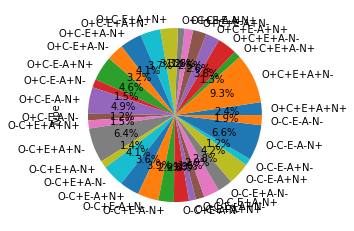

In [21]:
# muchos elementos: bajomuestreo
BF.groupby('type').size().plot(kind='pie',
                               y = "v1",
                               label = "Type",
                               autopct='%1.1f%%')

In [62]:
from sklearn.utils import resample      
BF_low_column=BF[BF['type']=='O+C-E-A-N-']
L=len(BF_low_column)
def downsampling_columns(db,classes,length,replacement=True,seed=22):
  for i in range(len(classes)):
    col=db[db['type']==classes[i]]
    downsample = resample(col,
                          replace=replacement,
                          n_samples=length,
                          random_state=seed)
    if i==0: # inicialization
      low_dataset=downsample
    else:
      low_dataset=pd.concat([low_dataset,downsample])
  return low_dataset

classes=list(set(BF['type'].tolist()))

BF_ds=downsampling_columns(BF,classes,L)
BF_ds

,id,N1.1,E1.1,O1.1,A1.1,C1.1,N2.1,E2.1,O2.1,A2.1,...,E5.10,O5.10,A5.10,C5.10,N6.10,E6.10,O6.10,A6.10,C6.10,type
22448,77760,4.0,5.0,5.0,5.0,5.0,4.0,4.0,4.0,4.0,...,4.0,2.0,4.0,2.0,4.0,5.0,1.0,4.0,2.0,O-C+E+A+N+
39590,135455,4.0,3.0,2.0,4.0,5.0,3.0,1.0,5.0,5.0,...,2.0,4.0,2.0,2.0,4.0,4.0,2.0,4.0,4.0,O-C+E+A+N+
13753,48335,4.0,4.0,5.0,3.0,2.0,5.0,3.0,2.0,5.0,...,2.0,4.0,4.0,4.0,2.0,5.0,2.0,4.0,5.0,O-C+E+A+N+
82314,281911,4.0,2.0,5.0,4.0,5.0,3.0,3.0,4.0,5.0,...,1.0,2.0,3.0,1.0,2.0,4.0,2.0,4.0,2.0,O-C+E+A+N+
89205,309000,5.0,5.0,5.0,4.0,5.0,4.0,1.0,5.0,5.0,...,5.0,5.0,4.0,2.0,2.0,5.0,2.0,4.0,4.0,O-C+E+A+N+
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39701,135835,5.0,4.0,5.0,3.0,3.0,4.0,2.0,5.0,3.0,...,5.0,2.0,3.0,3.0,4.0,2.0,3.0,4.0,2.0,O-C-E+A+N+
2358,8251,4.0,5.0,3.0,2.0,4.0,3.0,5.0,4.0,3.0,...,5.0,2.0,3.0,2.0,3.0,5.0,5.0,2.0,5.0,O-C-E+A+N+
6702,23310,4.0,4.0,4.0,2.0,3.0,2.0,4.0,4.0,5.0,...,4.0,2.0,3.0,2.0,4.0,4.0,1.0,4.0,4.0,O-C-E+A+N+
22453,77769,5.0,3.0,2.0,4.0,3.0,2.0,4.0,2.0,3.0,...,4.0,1.0,4.0,2.0,5.0,5.0,1.0,5.0,1.0,O-C-E+A+N+


<AxesSubplot:ylabel='Type'>

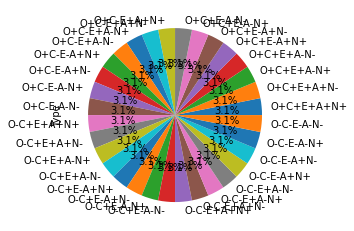

In [23]:
# muchos elementos: bajomuestreo
BF_ds.groupby('type').size().plot(kind='pie',
                               y = "v1",
                               label = "Type",
                               autopct='%1.1f%%')

In [24]:
# Importamos Scikit-Learn.
import sklearn
from sklearn.decomposition import PCA
import matplotlib as mpl
import matplotlib.pyplot as plt

# Función para visualizar la curva de aprendizaje a partir 
# del error de entrenamiento y de generalización.
def plot_learning_curve(train_error, generalization_error):
    n = len(train_error)
    if len(train_error) != len(generalization_error):
        print("Las secuencias de error de entrenamiento y generalización deben tener el mismo tamaño.")
        return

    balance_point = np.array(generalization_error).argmin() + 1
    plt.figure(figsize = (8, 5), dpi = 105)

    plt.plot(range(1, n + 1), train_error, label="Entrenamiento")
    plt.plot(range(1, n + 1), generalization_error, label="Generalización")
    plt.xticks(range(0, n + 1, 2))
    plt.xlabel("Profundidad máxima")
    plt.ylabel("Error")
    y_min, y_max = plt.gca().get_ylim() 
    plt.vlines(balance_point, y_min, y_max, colors = ['red'], linestyles = ['dashdot'])
    plt.ylim([y_min, y_max])
    plt.text(balance_point + 1, 0.165, 'Punto de balance')
    plt.legend();

def cumulative_explained_variance_plot(expl_variance):

    cum_var_exp = np.cumsum(expl_variance)

    plt.figure(dpi = 100, figsize = (6, 4))
    plt.title('Curva acumulativa de la varianza explicada VS n° de componentes principales',
              fontdict= dict(family ='serif', size = 16))
    plt.xlabel('Número de componentes principales',
               fontdict= dict(family ='serif', size = 14))
    plt.ylabel('Varianza explicada acumulativa',
               fontdict= dict(family ='serif', size = 14))  

    nc = np.arange(1, expl_variance.shape[0] + 1)

    plt.plot(nc, cum_var_exp, '--r')
    plt.plot(nc, cum_var_exp, 'c*', ms = 5)   
    plt.show()

def componentes_minimos(X, min_var = 0.5, show_plot=True):
    """
    Entradas:
      X: Conjunto de datos de entrada para PCA
      min_var: Varianza explicada mínima tras aplicar PCA.
    Retorna:
      min_comp: Número mínimo de componentes para la varianza dada.
    """
    ### INICIO DE CODIGO ### 

    pca = PCA()
    X_train_transf = pca.fit_transform(X)
    varianza_expl = pca.explained_variance_ratio_

    if show_plot==True:
        cumulative_explained_variance_plot(varianza_expl)
    
    cum_var_exp = np.cumsum(varianza_expl)
    min_comp = [n for n,i in enumerate(cum_var_exp) if i>min_var][1]

    ### FIN DEL CÓDIGO ###

    return min_comp

In [25]:
# FUNCIÓN CALIFICADA entrenar_pipeline:

# Funciones utilizadas en el ejercicio. 

from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

def entrenar_pipeline(X_train, y_train, params, k, seed = 22):               
  """
    Entradas:
      X_train: arreglo de NumPy con tamaño (n,m) con las imágenes de la partición de entrenamiento.
      y_train: arreglo de NumPy con (n,) con las etiquetas de la partición.
      params: parámetros del modelo usados en grid search.
      k: número de pliegues de la validación cruzada
      seed: semilla aleatoria para PCA y SVC.

    Retorna:
      gsearch: Grid Search entrenado con el pipeline de ejecución señalado.
  """
  ### INICIO DE CÓDIGO ### 
  
  pipeline = Pipeline([
                       ('pca', PCA(random_state=seed)),
                       ('svc', SVC(random_state=seed))
                       ])
  
  gsearch = GridSearchCV(pipeline,
                         params,
                         cv=k
                         )
  
  gsearch.fit(X_train, y_train)

  ### FIN DEL CÓDIGO ###

  return gsearch

A partir de aquí, comienza el desarrollo de la función principal svm_function, que podrá aplicarse a diferentes conjuntos de datos. Dándole además el nombre de su columna de clasificación, la distribución entre entrenamiento y test y la semilla de aleatoriedad, el algoritmo será automático.

In [26]:
#División del conjunto de datos, entre datos de entrenamiento y datos de prueba
from sklearn.model_selection import train_test_split
import numpy.linalg

def svm_function(BF_ds, type_column, division, rng):

    X_train, X_test, y_train, y_test = train_test_split(BF_ds.drop(['id',type_column], axis=1), 
                                                        BF_ds[type_column], 
                                                        test_size = division,
                                                        random_state=rng,
                                                        stratify=BF_ds['type'])
    
    print(f"Forma de los datasets:\nX_train {X_train.shape}, y_train {y_train.shape}\nX_train {X_test.shape}, y_train {y_test.shape})")
    
    # Tenemos 300 características en un problema de 95450 elementos. Podríamos servirnos de un PCA para ayudar a reducir la dimensionalidad.
    
    print(f'Se necesita por lo menos {componentes_minimos(X_train, 0.5)} componentes para una varianza explicada de {0.5}.')
    print(f'Se necesita por lo menos {componentes_minimos(X_train, 0.65, show_plot=False)} componentes para una varianza explicada de {0.65}.')
    print(f'Se necesita por lo menos {componentes_minimos(X_train, 0.8, show_plot=False)} componentes para una varianza explicada de {0.8}.')
    print(f'Se necesita por lo menos {componentes_minimos(X_train, 0.9, show_plot=False)} componentes para una varianza explicada de {0.9}.')
    
    # Algunas gráficas que pueden ser de interés para analizar el rendimiento:
    U, S, Vt = np.linalg.svd(X_train, full_matrices=False)
    S = np.diag(S)

    plt.figure(1)
    plt.figure(dpi = 100, figsize = (6, 4))
    plt.semilogy(np.diag(S))
    plt.title('Valores singulares')
    plt.show()

    plt.figure(2)
    plt.figure(dpi = 100, figsize = (6, 4))
    plt.plot(np.cumsum(np.diag(S))/np.sum(np.diag(S)))
    plt.title('Valores Singulares Acumulativa')
    plt.show()
    
    # parámetros
    parameters = {      
    'pca__n_components': [11, 43, 110],
    'svc__kernel': ['rbf', 'sigmoid']
    }
    gsearch = entrenar_pipeline(X_train, y_train, parameters, k=2)

    try:
        print("Mejor configuración de parámetros:")

        best_parameters = gsearch.best_params_
        for param in sorted(parameters.keys()):
            print(f"\t{param}: {best_parameters[param]}")

        print(f"Exactitud (val): {gsearch.best_score_:.4f}")
        print(f'Exactitud (test): {gsearch.score(X_test, y_test):.4f}')
    except Exception as e:
        print("El objeto GridSearchCV no es válido:")
        print(e)
    
    # Introducimos solo 63 ya que para el último test llevado a cabo fue el mejor resultado
    parameters = {      
        'pca__n_components': [best_parameters['pca__n_components']],
        'svc__kernel': [best_parameters['svc__kernel']]
    }
    # Entrenamiento de modelo de clasificación GridSearchCV con Pipeline.
    gsearch_svm = entrenar_pipeline(X_train, y_train, parameters, k=2)
    
    return gsearch_svm, X_test, y_test

Este pipeline + graficación de resultados es nuestro **algoritmo principal SVM**. Con gsearch entrenado con los parámetros y kernel adecuado, exportamos el resultado.

## **2.1. Ejecución rápida de la función svm_function()**

A continuación, vamos a obtener la matriz de confusión para el modelo entrenado. La función previa nos da, además del modelo, el conjunto de test necesario para ello.

Forma de los datasets:
X_train (7347, 300), y_train (7347,)
X_train (3149, 300), y_train (3149,))


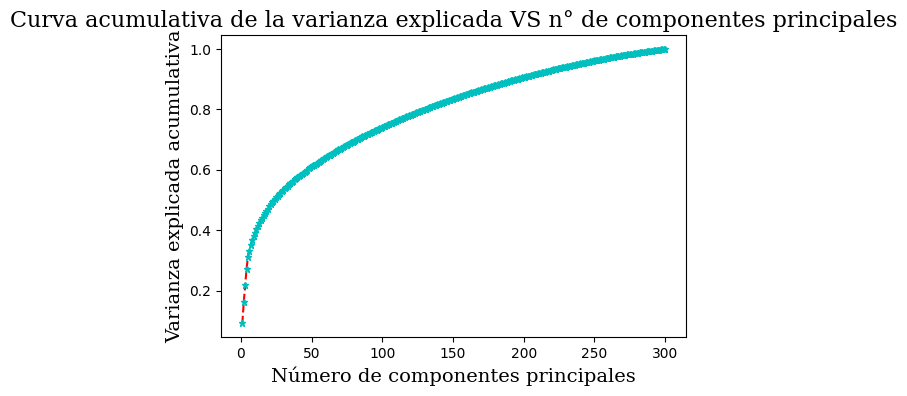

Se necesita por lo menos 24 componentes para una varianza explicada de 0.5.
Se necesita por lo menos 63 componentes para una varianza explicada de 0.65.
Se necesita por lo menos 130 componentes para una varianza explicada de 0.8.
Se necesita por lo menos 195 componentes para una varianza explicada de 0.9.


<Figure size 432x288 with 0 Axes>

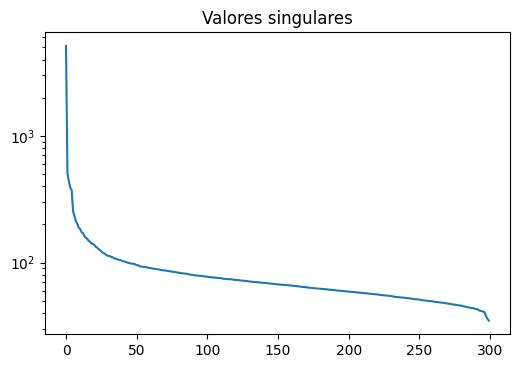

<Figure size 432x288 with 0 Axes>

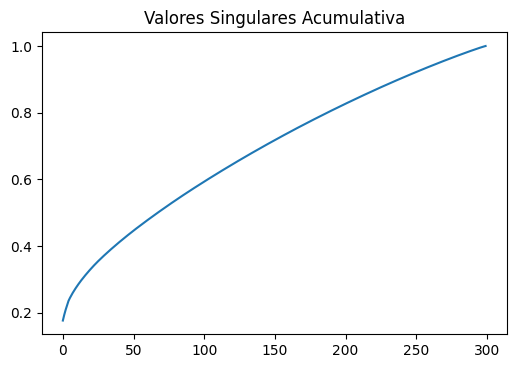

Mejor configuración de parámetros:
	pca__n_components: 43
	svc__kernel: rbf
Exactitud (val): 0.7426
Exactitud (test): 0.7869


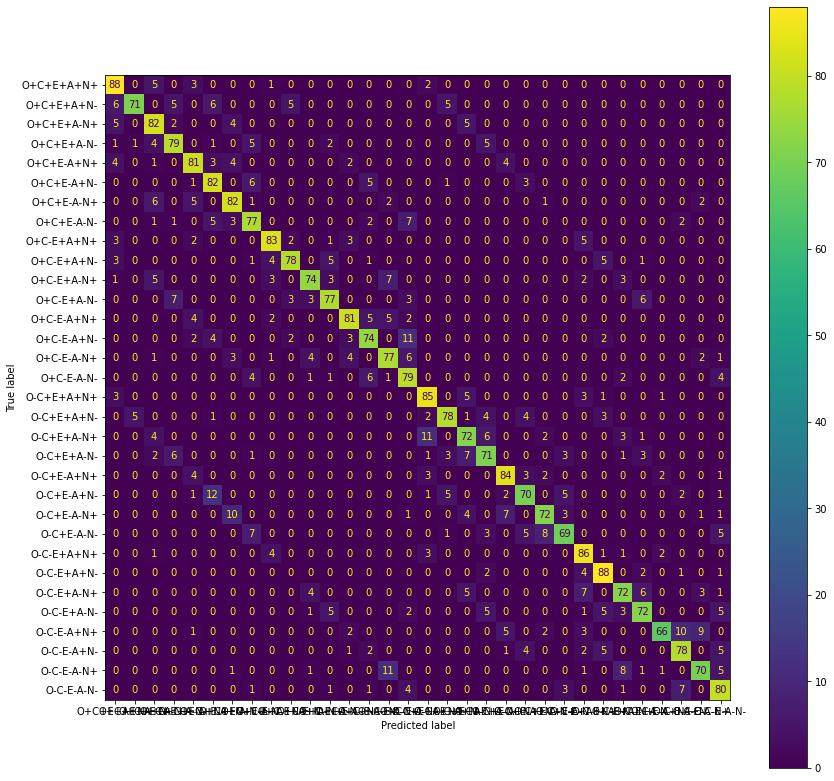

In [26]:
from sklearn.metrics import plot_confusion_matrix

# Ejecución de la función
gsearch_svm, X_test_svm, y_test_svm=svm_function(BF_ds, 'type', 0.3, 22)

fig, ax = plt.subplots(figsize=(14,14))
plot_confusion_matrix(gsearch_svm, X_test_svm, y_test_svm, display_labels = gsearch_svm.classes_, ax=ax)

# **3. Segunda etapa: árboles de decisión**

In [27]:
# Árbol de decisión (librerías)
from sklearn.tree import DecisionTreeClassifier #tree
from sklearn.tree import plot_tree
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

El árbol, al igual que el algoritmo svm mediante svm_function, ha sido sintetizado en una función tree:

In [28]:
def tree(BF,name_column,rng,fig_size_cm=5,fig_size_t=200,depth=100):
  # sample
  BF=BF.sample(5000)
  X_train_, X_test_, y_train_, y_test_ = train_test_split(BF.drop(['id',name_column], axis=1), 
                                                      BF[name_column], 
                                                      test_size = 0.3,
                                                      random_state=rng,
                                                      stratify=BF[name_column])

  clf_dt=DecisionTreeClassifier(random_state=rng)
  clf_dt=clf_dt.fit(X_train_, y_train_)

  path=clf_dt.cost_complexity_pruning_path(X_train_, y_train_)
  ccp_alphas=path.ccp_alphas
  ccp_alphas=ccp_alphas[:-1] # overfitting excluido


  # Árboles de decisión
  clf_dts=[]
  for ccp_alpha in ccp_alphas:
    clf_dt=DecisionTreeClassifier(random_state=rng,ccp_alpha=ccp_alpha)
    clf_dt.fit(X_train_, y_train_)
    clf_dts.append(clf_dt)

  # proceso de validación cruzada
  alpha_loop_values=[]
  for ccp_alpha in ccp_alphas:
    clf_dt=DecisionTreeClassifier(random_state=rng, ccp_alpha=ccp_alpha)
    scores=cross_val_score(clf_dt,X_train_,y_train_,cv=5)
    alpha_loop_values.append([ccp_alpha,np.mean(scores),np.std(scores)])

  alpha_results=pd.DataFrame(alpha_loop_values,
                            columns=['alpha','mean_accuracy','std'])

  # dejamos en comentario el plot de coeficientes alfa - para un usuario estándar, no aporta nada sacarlo.
  # en este gráfico se encuentran los parámetros alfa disponibles, escogiéndose el que evite mayor sobreajuste y prediga bien
  #alpha_results.plot(x='alpha',y='mean_accuracy',yerr='std',marker='o',linestyle='--')
  alphaMax=alpha_results[alpha_results['mean_accuracy']==max(alpha_results['mean_accuracy'])]
  alphaMaxChoice=list(alphaMax.alpha)[int(np.floor(len(alphaMax)/2.0))]
  alphaMaxChoice


  # árbol depurado
  clf_dt_pruned=DecisionTreeClassifier(random_state=rng,
                                      ccp_alpha=alphaMaxChoice)
  clf_dt_pruned=clf_dt_pruned.fit(X_train_, y_train_)

  return clf_dt_pruned, X_test_, y_test_

## **3.1  Ejecuciones de la función tree() de clasificación binaria**

DataBases a emplear:

In [95]:
# puntuaciones en cada pregunta
BF_questions

,id,N1.1,E1.1,O1.1,A1.1,C1.1,N2.1,E2.1,O2.1,A2.1,...,N5.10,E5.10,O5.10,A5.10,C5.10,N6.10,E6.10,O6.10,A6.10,C6.10
1,4,2.0,4.0,5.0,4.0,5.0,1.0,3.0,5.0,5.0,...,4.0,4.0,5.0,5.0,4.0,1.0,5.0,1.0,5.0,2.0
5,15,5.0,4.0,5.0,4.0,4.0,2.0,2.0,4.0,3.0,...,3.0,1.0,5.0,2.0,4.0,3.0,5.0,1.0,3.0,4.0
10,21,4.0,5.0,4.0,4.0,5.0,1.0,4.0,4.0,5.0,...,4.0,5.0,5.0,2.0,2.0,4.0,5.0,1.0,4.0,1.0
12,23,4.0,2.0,4.0,3.0,3.0,5.0,2.0,4.0,2.0,...,2.0,4.0,4.0,4.0,3.0,4.0,4.0,1.0,4.0,2.0
13,24,4.0,2.0,4.0,5.0,5.0,1.0,4.0,2.0,3.0,...,5.0,4.0,5.0,5.0,1.0,4.0,4.0,2.0,3.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200819,334148,3.0,5.0,5.0,4.0,4.0,5.0,5.0,5.0,3.0,...,4.0,5.0,2.0,5.0,2.0,2.0,5.0,1.0,4.0,2.0
200821,334151,2.0,5.0,5.0,1.0,5.0,2.0,5.0,5.0,5.0,...,4.0,4.0,5.0,4.0,4.0,1.0,4.0,1.0,5.0,1.0
200822,334154,2.0,4.0,5.0,3.0,3.0,1.0,1.0,4.0,5.0,...,4.0,4.0,3.0,2.0,4.0,2.0,5.0,1.0,4.0,1.0
200823,334155,3.0,4.0,5.0,4.0,4.0,2.0,2.0,5.0,4.0,...,5.0,5.0,5.0,5.0,4.0,2.0,4.0,3.0,1.0,2.0


In [96]:
# resultados para la categoría convertidos al caso binario (+, -)
BF_score_bin

,id,agreeable_score,extraversion_score,openness_score,conscientiousness_score,neuroticism_score
2,4,A+,E+,O+,C+,N-
13,15,A+,E-,O-,C+,N+
19,21,A+,E+,O+,C-,N-
21,23,A-,E-,O+,C-,N+
22,24,A+,E+,O-,C+,N+
...,...,...,...,...,...,...
307300,334148,A-,E+,O+,C+,N-
307303,334151,A+,E+,O+,C+,N-
307306,334154,A+,E+,O-,C+,N-
307307,334155,A+,E+,O+,C-,N-


Definimos los parámetros que usaremos para todas las pruebas:

In [113]:
fig_size_cm=5
fig_size_tree=200
depth=100

### **3.1.1. Openness score.**

In [98]:
BF_O=pd.merge(BF_questions, BF_score_bin[['id','openness_score']], on = "id")
name_column_O='openness_score'

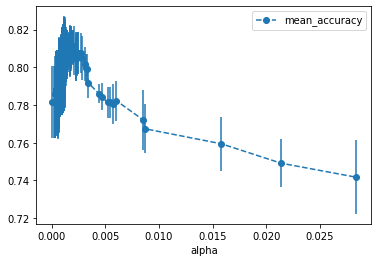

In [99]:
clf_dt_pruned_O, X_test_O, y_test_O=tree(BF_O,name_column_O,fig_size_cm,fig_size_tree,depth)

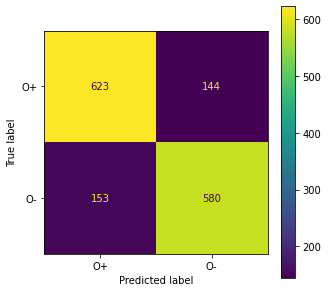

In [114]:
# matriz de confusión
fig, ax = plt.subplots(figsize=(fig_size_cm, fig_size_cm))
plot_CF_O=plot_confusion_matrix(clf_dt_pruned_O,
                    X_test_O,
                    y_test_O,
                    ax=ax)
plt.show()

# plot del árbol
plt.figure(figsize=(fig_size_tree,fig_size_tree))
plot_T_O=plot_tree(clf_dt_pruned_O,
               max_depth=depth,
               filled=True,
               rounded=True,
               feature_names=BF_O.drop(['id',name_column_O], axis=1).columns)
plt.show()

### **3.1.2. Conscientiousness score.**

In [101]:
BF_C=pd.merge(BF_questions, BF_score_bin[['id','conscientiousness_score']], on = "id")
name_column_C='conscientiousness_score'

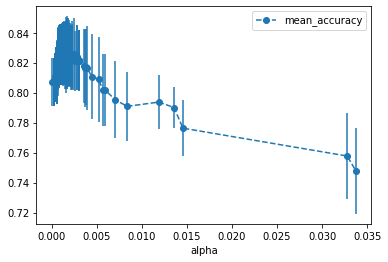

In [102]:
clf_dt_pruned_C, X_test_C, y_test_C=tree(BF_C,name_column_C,fig_size_cm,fig_size_tree,depth)

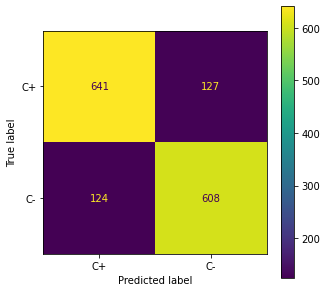

In [117]:
# matriz de confusión
fig, ax = plt.subplots(figsize=(fig_size_cm, fig_size_cm))
plot_CF_C=plot_confusion_matrix(clf_dt_pruned_C,
                    X_test_C,
                    y_test_C,
                    ax=ax)
plt.show()

# plot del árbol
plt.figure(figsize=(fig_size_tree,fig_size_tree))
plot_T_C=plot_tree(clf_dt_pruned_C,
               max_depth=depth,
               filled=True,
               rounded=True,
               feature_names=BF_C.drop(['id',name_column_C], axis=1).columns)
plt.show()

### **3.1.3. Extraversion score.**

In [104]:
BF_E=pd.merge(BF_questions, BF_score_bin[['id','extraversion_score']], on = "id")
name_column_E='extraversion_score'

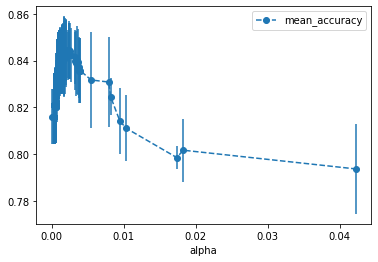

In [105]:
clf_dt_pruned_E, X_test_E, y_test_E=tree(BF_E,name_column_E,fig_size_cm,fig_size_tree,depth)

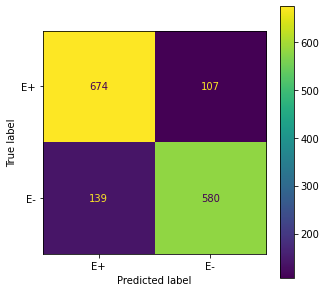

In [116]:
# matriz de confusión
fig, ax = plt.subplots(figsize=(fig_size_cm, fig_size_cm))
plot_CF_E=plot_confusion_matrix(clf_dt_pruned_E,
                    X_test_E,
                    y_test_E,
                    ax=ax)
plt.show()

# plot del árbol
plt.figure(figsize=(fig_size_tree,fig_size_tree))
plot_T_E=plot_tree(clf_dt_pruned_E,
               max_depth=depth,
               filled=True,
               rounded=True,
               feature_names=BF_E.drop(['id',name_column_E], axis=1).columns)
plt.show()

### **3.1.4. Agreeableness score.**

In [109]:
BF_A=pd.merge(BF_questions, BF_score_bin[['id','agreeable_score']], on = "id")
name_column_A='agreeable_score'

In [110]:
clf_dt_pruned_A, X_test_A, y_test_A=tree(BF_A,name_column_A,fig_size_cm,fig_size_tree,depth)

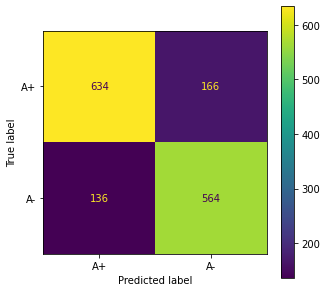

In [118]:
# matriz de confusión
fig, ax = plt.subplots(figsize=(fig_size_cm, fig_size_cm))
plot_CF_A=plot_confusion_matrix(clf_dt_pruned_A,
                    X_test_A,
                    y_test_A,
                    ax=ax)
plt.show()

# plot del árbol
plt.figure(figsize=(fig_size_tree,fig_size_tree))
plot_T_A=plot_tree(clf_dt_pruned_A,
               max_depth=depth,
               filled=True,
               rounded=True,
               feature_names=BF_A.drop(['id',name_column_A], axis=1).columns)
plt.show()

### **3.1.5. Neuroticism score.**

In [119]:
BF_N=pd.merge(BF_questions, BF_score_bin[['id','neuroticism_score']], on = "id")
name_column_N='neuroticism_score'

In [120]:
clf_dt_pruned_N, X_test_N, y_test_N=tree(BF_N,name_column_N,fig_size_cm,fig_size_tree,depth)

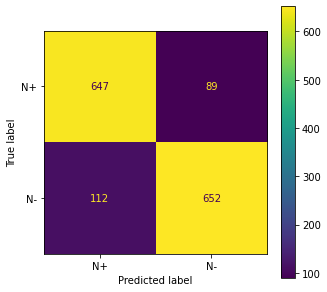

In [121]:
# matriz de confusión
fig, ax = plt.subplots(figsize=(fig_size_cm, fig_size_cm))
plot_CF_N=plot_confusion_matrix(clf_dt_pruned_N,
                    X_test_N,
                    y_test_N,
                    ax=ax)
plt.show()

# plot del árbol
plt.figure(figsize=(fig_size_tree,fig_size_tree))
plot_T_N=plot_tree(clf_dt_pruned_N,
               max_depth=depth,
               filled=True,
               rounded=True,
               feature_names=BF_N.drop(['id',name_column_N], axis=1).columns)
plt.show()

## **3.2. Árbol de decisión para las 32 combinaciones.**

Este caso particular es pesado en términos de tiempos de cómputo, pero es directamente comparable con el método SVM en lo que respecta a clasificación/matrices de confusión. Con la suficiente paciencia e interés, el árbol que obtenga de las 32 posibles clases puede aportar información.

In [106]:
# DataBase empleado en el SVM
BF_ds

,id,N1.1,E1.1,O1.1,A1.1,C1.1,N2.1,E2.1,O2.1,A2.1,...,E5.10,O5.10,A5.10,C5.10,N6.10,E6.10,O6.10,A6.10,C6.10,type
25173,87131,4.0,4.0,5.0,2.0,2.0,2.0,2.0,5.0,2.0,...,5.0,5.0,4.0,2.0,4.0,5.0,1.0,4.0,2.0,O+C-E-A+N+
19750,68794,4.0,5.0,5.0,3.0,4.0,3.0,4.0,5.0,5.0,...,1.0,5.0,5.0,3.0,2.0,4.0,3.0,2.0,4.0,O+C-E-A+N+
46527,158576,4.0,2.0,5.0,3.0,4.0,3.0,1.0,5.0,4.0,...,2.0,4.0,5.0,2.0,4.0,5.0,1.0,4.0,2.0,O+C-E-A+N+
90177,312873,4.0,2.0,5.0,3.0,2.0,2.0,2.0,5.0,1.0,...,4.0,4.0,4.0,2.0,2.0,4.0,3.0,3.0,2.0,O+C-E-A+N+
33307,113992,5.0,4.0,5.0,4.0,5.0,4.0,4.0,5.0,4.0,...,3.0,5.0,4.0,2.0,3.0,5.0,1.0,5.0,2.0,O+C-E-A+N+
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64399,220243,4.0,3.0,4.0,4.0,5.0,1.0,4.0,5.0,5.0,...,1.0,1.0,5.0,2.0,2.0,4.0,4.0,2.0,4.0,O-C-E-A+N-
14731,51557,1.0,3.0,4.0,4.0,2.0,1.0,4.0,2.0,4.0,...,4.0,3.0,3.0,3.0,2.0,5.0,1.0,4.0,1.0,O-C-E-A+N-
79670,272270,4.0,2.0,3.0,3.0,4.0,1.0,1.0,4.0,4.0,...,2.0,5.0,4.0,1.0,1.0,5.0,5.0,4.0,1.0,O-C-E-A+N-
73260,249258,4.0,4.0,4.0,2.0,4.0,2.0,1.0,4.0,3.0,...,4.0,2.0,5.0,1.0,2.0,5.0,2.0,3.0,1.0,O-C-E-A+N-


In [122]:
# nueva definición de parámetros 
fig_size_cm_total=22
fig_size_tree_total=400
depth_total=5 # de lo contrario será imposible de computar

name_column_total='type'

In [123]:
clf_dt_pruned_total, X_test_total, y_test_total=tree(BF_ds,name_column_total,fig_size_cm_total,fig_size_tree_total,depth_total)

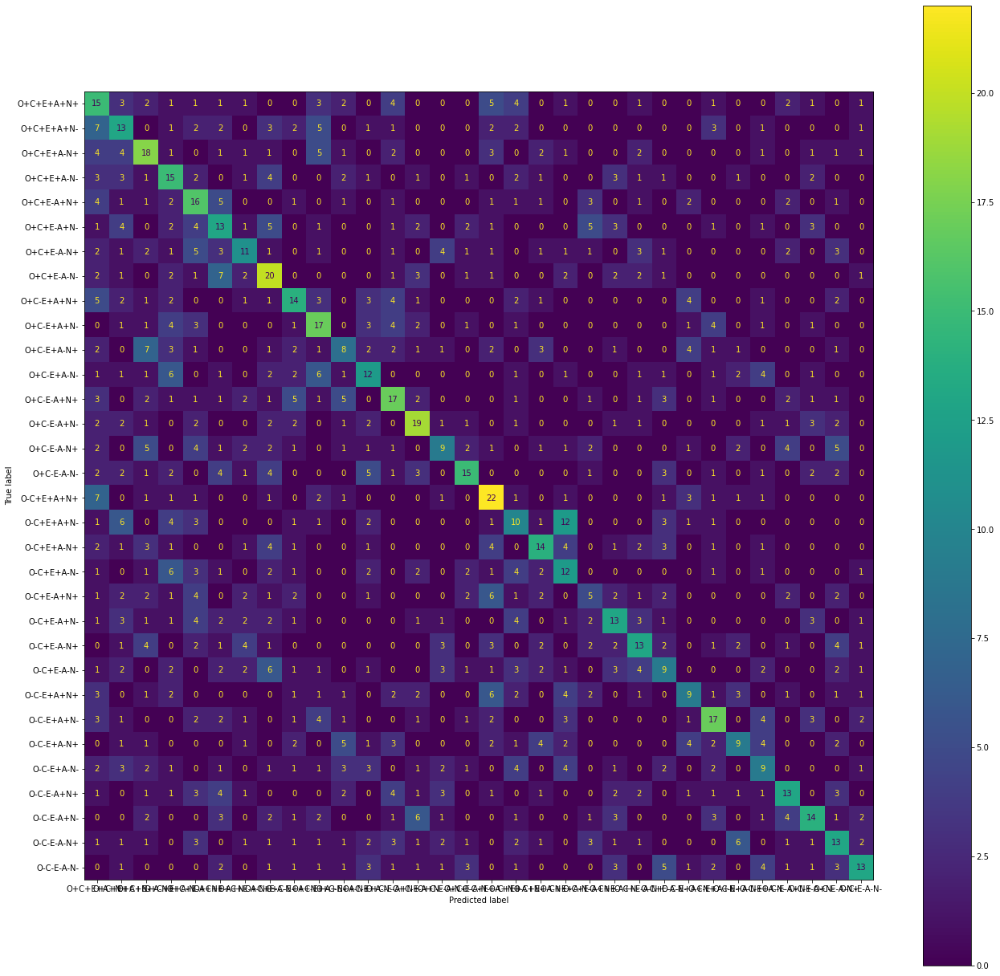

In [ ]:
# matriz de confusión
fig, ax = plt.subplots(figsize=(fig_size_cm_total, fig_size_cm_total))
plot_CF=plot_confusion_matrix(clf_dt_pruned_total,
                    X_test_total,
                    y_test_total,
                    ax=ax)
plt.show()

# plot del árbol
plt.figure(figsize=(fig_size_tree_total,fig_size_tree_total))
plot_T=plot_tree(clf_dt_pruned_total,
               max_depth=depth_total,
               filled=True,
               rounded=True,
               feature_names=BF_ds.drop(['id',name_column_total], axis=1).columns)
plt.show()

# **4. Tercera etapa: clasificación mediante lógica difusa**

Instalamos la función scikit-fuzzy, que requeriremos para este nuevo método.

In [21]:
!pip3 install -U scikit-fuzzy

  Created wheel for scikit-fuzzy: filename=scikit_fuzzy-0.4.2-py3-none-any.whl size=894089 sha256=e467e16b12b97d0601ea5bd25f21e8826ed424a386c11fbd809207439235c014
  Stored in directory: c:\users\dynad\appdata\local\pip\cache\wheels\32\2c\a1\a90a7d7dd8448ec029f298a61f3490275e99b17aa348be675c
Successfully built scikit-fuzzy


In [27]:
import skfuzzy as fuzz
from skfuzzy import control as ctrl

DataFrame generado previamente usando únicamente las puntuaciones

In [28]:
BF_score

,id,agreeable_score,extraversion_score,openness_score,conscientiousness_score,neuroticism_score
2,4,0.880000,0.770000,0.860000,0.896667,0.296667
13,15,0.780000,0.613333,0.713333,0.833333,0.683333
19,21,0.746667,0.830000,0.856667,0.710000,0.460000
21,23,0.676667,0.513333,0.770000,0.663333,0.696667
22,24,0.813333,0.703333,0.700000,0.770000,0.680000
...,...,...,...,...,...,...
307300,334148,0.650000,0.810000,0.783333,0.730000,0.540000
307303,334151,0.723333,0.816667,0.783333,0.853333,0.320000
307306,334154,0.763333,0.843333,0.710000,0.776667,0.410000
307307,334155,0.760000,0.710000,0.773333,0.696667,0.526667


Lo utilizamos para obtener diferentes listas de valores para cada categoría, de peso en la definición de números borrosos.

In [29]:
BF_score_avgs=BF_score.drop('id', axis=1).apply(np.mean, axis=0) # medias para cada score, las aplicamos en la siguiente celda como thresholds
np.round(BF_score_avgs,2)

agreeable_score            0.71
extraversion_score         0.67
openness_score             0.74
conscientiousness_score    0.71
neuroticism_score          0.57
dtype: float64

In [30]:
BF_score_max=BF_score.drop('id', axis=1).apply(np.max, axis=0) # medias para cada score, las aplicamos en la siguiente celda como thresholds
np.round(BF_score_max,2)

agreeable_score            1.00
extraversion_score         0.99
openness_score             1.00
conscientiousness_score    1.00
neuroticism_score          0.99
dtype: float64

In [31]:
BF_score_min=BF_score.drop('id', axis=1).apply(np.min, axis=0) # medias para cada score, las aplicamos en la siguiente celda como thresholds
np.round(BF_score_min,2)

agreeable_score            0.20
extraversion_score         0.21
openness_score             0.30
conscientiousness_score    0.21
neuroticism_score          0.20
dtype: float64

Podríamos requerir de categorizaciones intermedias entre min/max y promedio. Diseñaremos una función que nos asista para ello.

In [32]:
def minMaxInbetween(BF_MinAvgMax, avg_weigth=0.5):
    BF_score_lw=BF_MinAvgMax[1]*avg_weigth+BF_MinAvgMax[0]*(1-avg_weigth)
    BF_score_hi=BF_MinAvgMax[1]*avg_weigth+BF_MinAvgMax[2]*(1-avg_weigth)
    return BF_score_lw, BF_score_hi

def minMaxSmoothing(BF_MinLwHiMax, avg_weigth=0.5):
    BF_score_min=BF_MinLwHiMax[1]*avg_weigth+BF_MinLwHiMax[0]*(1-avg_weigth)
    BF_score_max=BF_MinLwHiMax[2]*avg_weigth+BF_MinLwHiMax[3]*(1-avg_weigth)
    return BF_score_min, BF_score_max

In [33]:
BF_score_lw, BF_score_hi = minMaxInbetween([BF_score_min, BF_score_avgs, BF_score_max], 0.7)
#BF_score_min, BF_score_max = minMaxSmoothing([BF_score_min, BF_score_lw, BF_score_hi, BF_score_max], 0.9)

In [34]:
bigFiveDBquestionsNoNAFuzzy=bigFiveDBquestionsNoNA.drop(['country','Unnamed: 0','complTime'],axis=1)
bigFiveDB_fNoNAFuzzy=bigFiveDB_fNoNA.drop(['country'],axis=1)

In [35]:
bigFiveDB_fNoNAFuzzy

,id,age,sex,agreeable_score,extraversion_score,openness_score,conscientiousness_score,neuroticism_score
2,4,36,2,0.880000,0.770000,0.860000,0.896667,0.296667
13,15,48,2,0.780000,0.613333,0.713333,0.833333,0.683333
19,21,38,2,0.746667,0.830000,0.856667,0.710000,0.460000
21,23,43,1,0.676667,0.513333,0.770000,0.663333,0.696667
22,24,30,2,0.813333,0.703333,0.700000,0.770000,0.680000
...,...,...,...,...,...,...,...,...
307300,334148,20,1,0.650000,0.810000,0.783333,0.730000,0.540000
307303,334151,35,2,0.723333,0.816667,0.783333,0.853333,0.320000
307306,334154,20,2,0.763333,0.843333,0.710000,0.776667,0.410000
307307,334155,19,1,0.760000,0.710000,0.773333,0.696667,0.526667


Utilizaremos un nuevo DataBase organizado con las respuestas a las preguntas y los scores para cada categoría.

In [36]:
BF_merged_ID=pd.merge(BF_questions, bigFiveDB_fNoNAFuzzy.drop(['age', 'sex'],axis=1), on = "id")
BF_merged=pd.merge(BF_questions, bigFiveDB_fNoNAFuzzy.drop(['age', 'sex'],axis=1), on = "id").drop(['id'],axis=1)
BF_merged_ID

,id,N1.1,E1.1,O1.1,A1.1,C1.1,N2.1,E2.1,O2.1,A2.1,...,N6.10,E6.10,O6.10,A6.10,C6.10,agreeable_score,extraversion_score,openness_score,conscientiousness_score,neuroticism_score
0,4,2.0,4.0,5.0,4.0,5.0,1.0,3.0,5.0,5.0,...,1.0,5.0,1.0,5.0,2.0,0.880000,0.770000,0.860000,0.896667,0.296667
1,15,5.0,4.0,5.0,4.0,4.0,2.0,2.0,4.0,3.0,...,3.0,5.0,1.0,3.0,4.0,0.780000,0.613333,0.713333,0.833333,0.683333
2,21,4.0,5.0,4.0,4.0,5.0,1.0,4.0,4.0,5.0,...,4.0,5.0,1.0,4.0,1.0,0.746667,0.830000,0.856667,0.710000,0.460000
3,23,4.0,2.0,4.0,3.0,3.0,5.0,2.0,4.0,2.0,...,4.0,4.0,1.0,4.0,2.0,0.676667,0.513333,0.770000,0.663333,0.696667
4,24,4.0,2.0,4.0,5.0,5.0,1.0,4.0,2.0,3.0,...,4.0,4.0,2.0,3.0,1.0,0.813333,0.703333,0.700000,0.770000,0.680000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95445,334148,3.0,5.0,5.0,4.0,4.0,5.0,5.0,5.0,3.0,...,2.0,5.0,1.0,4.0,2.0,0.650000,0.810000,0.783333,0.730000,0.540000
95446,334151,2.0,5.0,5.0,1.0,5.0,2.0,5.0,5.0,5.0,...,1.0,4.0,1.0,5.0,1.0,0.723333,0.816667,0.783333,0.853333,0.320000
95447,334154,2.0,4.0,5.0,3.0,3.0,1.0,1.0,4.0,5.0,...,2.0,5.0,1.0,4.0,1.0,0.763333,0.843333,0.710000,0.776667,0.410000
95448,334155,3.0,4.0,5.0,4.0,4.0,2.0,2.0,5.0,4.0,...,2.0,4.0,3.0,1.0,2.0,0.760000,0.710000,0.773333,0.696667,0.526667


Generación de números difusos: de momento se han probado números difusos triangulares y gaussianos, pero hay más posibilidades.

In [37]:
def fuzzy_number_trimf(x_qual, index, division_arrays):
    # Custom membership functions can be built interactively with a familiar,
    # Pythonic API
    score_min = fuzz.trimf(x_qual, [0, int(np.round(division_arrays[0],2)[index]*100), int(np.round(division_arrays[1],2)[index]*100)])
    score_lw = fuzz.trimf(x_qual, [int(np.round(division_arrays[0],2)[index]*100), int(np.round(division_arrays[1],2)[index]*100), int(np.round(division_arrays[2],2)[index]*100)])
    score_md = fuzz.trimf(x_qual, [int(np.round(division_arrays[1],2)[index]*100), int(np.round(division_arrays[2],2)[index]*100), int(np.round(division_arrays[3],2)[index]*100)])
    score_hi = fuzz.trimf(x_qual, [int(np.round(division_arrays[2],2)[index]*100), int(np.round(division_arrays[3],2)[index]*100), int(np.round(division_arrays[4],2)[index]*100)])
    score_max = fuzz.trimf(x_qual, [int(np.round(division_arrays[3],2)[index]*100), int(np.round(division_arrays[4],2)[index]*100), 101])

    return [score_min, score_lw, score_md, score_hi, score_max]

def fuzzy_number_gaussmf(x_qual, index, division_arrays, gauss_par=50, minWeight=0.1, maxWeight=0.05):
    # Custom membership functions can be built interactively with a familiar,
    # Pythonic API
    score_min = fuzz.sigmf(x_qual, int((1-minWeight)*np.round(division_arrays[1],2)[index]*100), -abs(int(np.round(division_arrays[1]-division_arrays[0],2)[index]*(gauss_par)))/101)
    score_lw = fuzz.gauss2mf(x_qual, int(np.round(division_arrays[1],2)[index]*100), abs(int(np.round(division_arrays[1]-division_arrays[0],2)[index]*gauss_par)), int(np.round(division_arrays[1],2)[index]*100), abs(int(np.round(division_arrays[1]-division_arrays[2],2)[index]*gauss_par)))
    score_md = fuzz.gauss2mf(x_qual, int(np.round(division_arrays[2],2)[index]*100), abs(int(np.round(division_arrays[1]-division_arrays[2],2)[index]*gauss_par)), int(np.round(division_arrays[2],2)[index]*100), abs(int(np.round(division_arrays[3]-division_arrays[2],2)[index]*gauss_par)))
    score_hi = fuzz.gauss2mf(x_qual, int(np.round(division_arrays[3],2)[index]*100), abs(int(np.round(division_arrays[3]-division_arrays[2],2)[index]*gauss_par)), int(np.round(division_arrays[3],2)[index]*100), abs(int(np.round(division_arrays[3]-division_arrays[4],2)[index]*gauss_par)))
    score_max = fuzz.sigmf(x_qual, int((1+maxWeight)*np.round(division_arrays[3],2)[index]*100), abs(int(np.round(division_arrays[1]-division_arrays[0],2)[index]*(gauss_par)))/101)
    return [score_min, score_lw, score_md, score_hi, score_max]

def fuzzy_number_gen(x_qual, index, division_arrays, gauss_par=50, mode='tri'):
    
    if mode=='tri':
        return fuzzy_number_trimf(x_qual, index, BF_score_arrays)
    elif mode=='gauss':
        return fuzzy_number_gaussmf(x_qual, index, BF_score_arrays, gauss_par)
    else:
        return fuzzy_number_trimf(x_qual, index, BF_score_arrays)

In [38]:
# New Antecedent/Consequent objects hold universe variables and membership
# functions
x_qual = np.arange(0, 101, 1)
BF_score_arrays=[BF_score_min, BF_score_lw, BF_score_avgs, BF_score_hi, BF_score_max]
gauss_par=50

mode_='gauss'
A_array=fuzzy_number_gen(x_qual, 0, BF_score_arrays, mode=mode_)
E_array=fuzzy_number_gen(x_qual, 1, BF_score_arrays, mode=mode_)
O_array=fuzzy_number_gen(x_qual, 2, BF_score_arrays, mode=mode_)
C_array=fuzzy_number_gen(x_qual, 3, BF_score_arrays, mode=mode_)
N_array=fuzzy_number_gen(x_qual, 4, BF_score_arrays, mode=mode_)

Representación de los números difusos empleados.

In [39]:
def fuzzy_plot(x_qual, fuzzy_numbers, graph_names, fig_size=(17, 22)):
    fig, ax = plt.subplots(nrows=5, figsize=fig_size)
    
    for i in range(len(fuzzy_numbers)):
        ax[i].plot(x_qual, fuzzy_numbers[i][0], 'k', linewidth=1.5, label='Min')
        ax[i].plot(x_qual, fuzzy_numbers[i][1], 'b', linewidth=1.5, label='Bad')
        ax[i].plot(x_qual, fuzzy_numbers[i][2], 'g', linewidth=1.5, label='Decent')
        ax[i].plot(x_qual, fuzzy_numbers[i][3], 'r', linewidth=1.5, label='Great')
        ax[i].plot(x_qual, fuzzy_numbers[i][4], 'y', linewidth=1.5, label='Max')
        ax[i].set_title(graph_names[i])
        ax[i].legend()

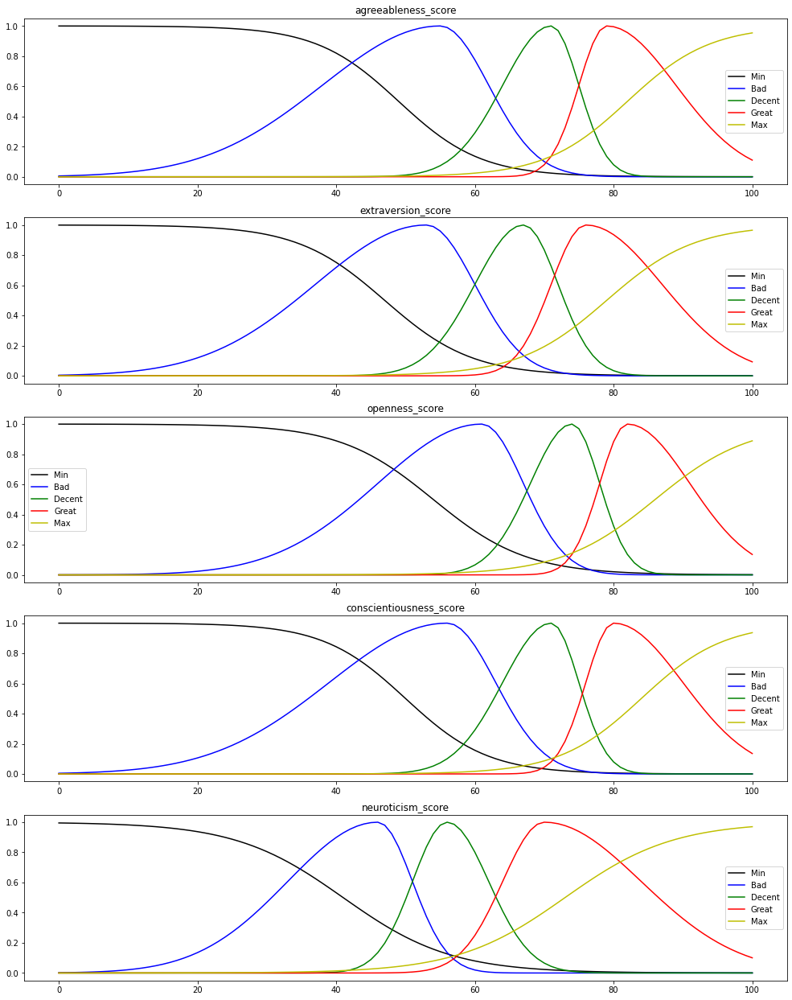

In [40]:
fuzzy_numbers=[A_array,E_array,O_array,C_array,N_array]
graph_names=['agreeableness_score','extraversion_score','openness_score','conscientiousness_score','neuroticism_score']
             
fuzzy_plot(x_qual, fuzzy_numbers, graph_names, fig_size=(17, 22))

Obtención de **grados de pertenencia** para cada categoría, por fila.

In [41]:
def class_results(fuzzy,score):
    x_qual = np.arange(0, 101, 1)
    N=len(fuzzy)
    array=[]
    for i in range(N):
        array.append(np.round(fuzz.interp_membership(x_qual, fuzzy[i], 100*score),6))
    return array

In [42]:
BF_merged_ID['agreeable_class']=BF_merged_ID['agreeable_score'].apply(lambda x: class_results(A_array,x))
BF_merged_ID['extraversion_class']=BF_merged_ID['extraversion_score'].apply(lambda x: class_results(E_array,x))
BF_merged_ID['openness_class']=BF_merged_ID['openness_score'].apply(lambda x: class_results(O_array,x))
BF_merged_ID['conscientiousness_class']=BF_merged_ID['conscientiousness_score'].apply(lambda x: class_results(C_array,x))
BF_merged_ID['neuroticism_class']=BF_merged_ID['neuroticism_score'].apply(lambda x: class_results(N_array,x))
BF_merged_ID

,id,N1.1,E1.1,O1.1,A1.1,C1.1,N2.1,E2.1,O2.1,A2.1,...,agreeable_score,extraversion_score,openness_score,conscientiousness_score,neuroticism_score,agreeable_class,extraversion_class,openness_class,conscientiousness_class,neuroticism_class
0,4,2.0,4.0,5.0,4.0,5.0,1.0,3.0,5.0,5.0,...,0.880000,0.770000,0.860000,0.896667,0.296667,"[0.001408, 1.5e-05, 0.00012, 0.666977, 0.733001]","[0.008556, 0.002802, 0.135335, 0.995876, 0.421...","[0.008556, 0.00017, 0.011109, 0.905955, 0.5]","[0.001263, 1e-05, 2.2e-05, 0.626679, 0.7216]","[0.811166, 0.454347, 1e-06, 0.0, 0.003774]"
1,15,5.0,4.0,5.0,4.0,4.0,2.0,2.0,4.0,3.0,...,0.780000,0.613333,0.713333,0.833333,0.683333,"[0.007531, 0.004526, 0.216265, 0.969233, 0.337...","[0.093775, 0.492822, 0.719992, 0.01402, 0.057531]","[0.07095, 0.228325, 0.903651, 0.029842, 0.101904]","[0.003657, 0.000504, 0.009101, 0.945037, 0.472...","[0.028848, 5e-05, 0.122102, 0.959375, 0.354313]"
2,21,4.0,5.0,4.0,4.0,5.0,1.0,4.0,4.0,5.0,...,0.746667,0.830000,0.856667,0.710000,0.460000,"[0.013164, 0.01963, 0.655967, 0.556965, 0.225728]","[0.003325, 0.000103, 0.005976, 0.816703, 0.65332]","[0.009009, 0.000225, 0.015004, 0.91929, 0.487646]","[0.028342, 0.100669, 1.0, 0.07956, 0.100823]","[0.344441, 1.0, 0.135335, 0.000335, 0.030025]"
3,23,4.0,2.0,4.0,3.0,3.0,5.0,2.0,4.0,2.0,...,0.676667,0.513333,0.770000,0.663333,0.696667,"[0.041528, 0.195531, 0.891291, 0.018899, 0.082...","[0.335028, 0.994162, 0.082469, 6e-06, 0.012369]","[0.031804, 0.028566, 0.75484, 0.457833, 0.208064]","[0.060288, 0.337273, 0.79968, 0.003154, 0.048767]","[0.024411, 1.5e-05, 0.075697, 0.995402, 0.39445]"
4,24,4.0,2.0,4.0,5.0,5.0,1.0,4.0,2.0,3.0,...,0.813333,0.703333,0.700000,0.770000,0.680000,"[0.004324, 0.000869, 0.036889, 0.972132, 0.472...","[0.024274, 0.047148, 0.798896, 0.526678, 0.202...","[0.085003, 0.324652, 0.800737, 0.011109, 0.085...","[0.010513, 0.011109, 0.324652, 0.75484, 0.235373]","[0.030025, 6.3e-05, 0.135335, 0.945959, 0.344441]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95445,334148,3.0,5.0,5.0,4.0,4.0,5.0,5.0,5.0,3.0,...,0.650000,0.810000,0.783333,0.730000,0.540000,"[0.063384, 0.360448, 0.692569, 0.002187, 0.054...","[0.004559, 0.000335, 0.019841, 0.901851, 0.578...","[0.026299, 0.015745, 0.556965, 0.655967, 0.242...","[0.020406, 0.052393, 0.882497, 0.216265, 0.135...","[0.157989, 0.278037, 0.923116, 0.028566, 0.079..."
95446,334151,2.0,5.0,5.0,1.0,5.0,2.0,5.0,5.0,5.0,...,0.723333,0.816667,0.783333,0.853333,0.320000,"[0.019371, 0.047148, 0.940321, 0.252394, 0.164...","[0.004115, 0.000237, 0.01402, 0.875134, 0.603934]","[0.026299, 0.015745, 0.556965, 0.655967, 0.242...","[0.002614, 0.000159, 0.001753, 0.866755, 0.555...","[0.761045, 0.559965, 1e-05, 0.0, 0.005081]"
95447,334154,2.0,4.0,5.0,3.0,3.0,1.0,1.0,4.0,5.0,...,0.763333,0.843333,0.710000,0.776667,0.410000,"[0.009975, 0.009794, 0.41344, 0.797392, 0.2784]","[0.002701, 4.6e-05, 0.00257, 0.75026, 0.699257]","[0.074141, 0.249352, 0.882497, 0.022794, 0.097...","[0.009437, 0.008479, 0.252394, 0.839944, 0.256...","[0.5, 0.928705, 0.011109, 8e-06, 0.016004]"
95448,334155,3.0,4.0,5.0,4.0,4.0,2.0,2.0,5.0,4.0,...,0.760000,0.710000,0.773333,0.696667,0.526667,"[0.010513, 0.011109, 0.457833, 0.75484, 0.266999]","[0.021839, 0.036658, 0.726149, 0.606531, 0.219...","[0.030381, 0.025065, 0.705403, 0.507399, 0.216...","[0.035323, 0.149645, 0.9799, 0.036889, 0.082417]","[0.182354, 0.412458, 0.798896, 0.015745, 0.068..."


Haciendo uso de los grados de pertenencia, ahora la discretización puede realizarse mediante muchas diferentes funciones de número difuso, y con más elementos, con una mayor facilidad.

In [43]:
def discretization_5(letter, array):
    #print(max(array))
    if max(array)==array[0]:
        return letter+'-'
    elif max(array)==array[1]:
        return letter.lower()+'-'
    elif max(array)==array[2]:
        return '__'
    elif max(array)==array[3]:
        return letter.lower()+'+'
    else:
        return letter+'+'

In [44]:
BF_merged_ID_bin=BF_merged_ID.copy(deep=True)
BF_merged_ID_bin['type']=BF_merged_ID['openness_class'].apply(lambda x: discretization_5('O', x))+BF_merged_ID['conscientiousness_class'].apply(lambda x: discretization_5('C', x))+BF_merged_ID['extraversion_class'].apply(lambda x: discretization_5('E', x))+BF_merged_ID['agreeable_class'].apply(lambda x: discretization_5('A', x))+BF_merged_ID['neuroticism_class'].apply(lambda x: discretization_5('N', x))

Para cada categoría, consideraremos el mayor grado de pertenencia. Ejemplo: columna 'neuroticism_class', buscamos para cada fila el valor máximo en el string.

In [45]:
BF_merged_ID_bin["openness_class_max"]=BF_merged_ID_bin["openness_class"].apply(max)
BF_merged_ID_bin["conscientiousness_class_max"]=BF_merged_ID_bin["conscientiousness_class"].apply(max)
BF_merged_ID_bin["extraversion_class_max"]=BF_merged_ID_bin["extraversion_class"].apply(max)
BF_merged_ID_bin["agreeable_class_max"]=BF_merged_ID_bin["agreeable_class"].apply(max)
BF_merged_ID_bin["neuroticism_class_max"]=BF_merged_ID_bin["neuroticism_class"].apply(max)
#BF_merged_ID_bin[['id','openness_class','conscientiousness_class','extraversion_class','agreeable_class','neuroticism_class','openness_class_max','conscientiousness_class_max','extraversion_class_max','agreeable_class_max','neuroticism_class_max']]

CASO: reglas AND mediante operador min() en los grados de pertenencia.
Ejemplo: el grado de pertenencia a o+C+e+a+N- se calcula obteniendo el mínimo de los presentes en o+, C+, e+, a+, N-, que para el caso que ilustramos fueron las clases para cada categoría de personalidad con el máximo grado de pertenencia por separado.

In [46]:
BF_merged_ID_bin['class_belonging']=BF_merged_ID_bin[['openness_class_max','conscientiousness_class_max','extraversion_class_max','agreeable_class_max','neuroticism_class_max']].min(axis=1)

In [47]:
BF_merged_ID_bin=BF_merged_ID_bin.drop(['openness_class_max','conscientiousness_class_max','extraversion_class_max','agreeable_class_max','neuroticism_class_max'], axis=1)

Hemos obtenido un DataBase con los strings que contienen grados de pertenencia, la clase generada y asignada teniendo en cuenta el criterio de discretización, y el grado de pertenencia a esta clase (que depende de la función utilizada para las reglas AND).

In [48]:
BF_merged_ID_bin

,id,N1.1,E1.1,O1.1,A1.1,C1.1,N2.1,E2.1,O2.1,A2.1,...,openness_score,conscientiousness_score,neuroticism_score,agreeable_class,extraversion_class,openness_class,conscientiousness_class,neuroticism_class,type,class_belonging
0,4,2.0,4.0,5.0,4.0,5.0,1.0,3.0,5.0,5.0,...,0.860000,0.896667,0.296667,"[0.001408, 1.5e-05, 0.00012, 0.666977, 0.733001]","[0.008556, 0.002802, 0.135335, 0.995876, 0.421...","[0.008556, 0.00017, 0.011109, 0.905955, 0.5]","[0.001263, 1e-05, 2.2e-05, 0.626679, 0.7216]","[0.811166, 0.454347, 1e-06, 0.0, 0.003774]",o+C+e+A+N-,0.721600
1,15,5.0,4.0,5.0,4.0,4.0,2.0,2.0,4.0,3.0,...,0.713333,0.833333,0.683333,"[0.007531, 0.004526, 0.216265, 0.969233, 0.337...","[0.093775, 0.492822, 0.719992, 0.01402, 0.057531]","[0.07095, 0.228325, 0.903651, 0.029842, 0.101904]","[0.003657, 0.000504, 0.009101, 0.945037, 0.472...","[0.028848, 5e-05, 0.122102, 0.959375, 0.354313]",__c+__a+n+,0.719992
2,21,4.0,5.0,4.0,4.0,5.0,1.0,4.0,4.0,5.0,...,0.856667,0.710000,0.460000,"[0.013164, 0.01963, 0.655967, 0.556965, 0.225728]","[0.003325, 0.000103, 0.005976, 0.816703, 0.65332]","[0.009009, 0.000225, 0.015004, 0.91929, 0.487646]","[0.028342, 0.100669, 1.0, 0.07956, 0.100823]","[0.344441, 1.0, 0.135335, 0.000335, 0.030025]",o+__e+__n-,0.655967
3,23,4.0,2.0,4.0,3.0,3.0,5.0,2.0,4.0,2.0,...,0.770000,0.663333,0.696667,"[0.041528, 0.195531, 0.891291, 0.018899, 0.082...","[0.335028, 0.994162, 0.082469, 6e-06, 0.012369]","[0.031804, 0.028566, 0.75484, 0.457833, 0.208064]","[0.060288, 0.337273, 0.79968, 0.003154, 0.048767]","[0.024411, 1.5e-05, 0.075697, 0.995402, 0.39445]",____e-__n+,0.754840
4,24,4.0,2.0,4.0,5.0,5.0,1.0,4.0,2.0,3.0,...,0.700000,0.770000,0.680000,"[0.004324, 0.000869, 0.036889, 0.972132, 0.472...","[0.024274, 0.047148, 0.798896, 0.526678, 0.202...","[0.085003, 0.324652, 0.800737, 0.011109, 0.085...","[0.010513, 0.011109, 0.324652, 0.75484, 0.235373]","[0.030025, 6.3e-05, 0.135335, 0.945959, 0.344441]",__c+__a+n+,0.754840
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95445,334148,3.0,5.0,5.0,4.0,4.0,5.0,5.0,5.0,3.0,...,0.783333,0.730000,0.540000,"[0.063384, 0.360448, 0.692569, 0.002187, 0.054...","[0.004559, 0.000335, 0.019841, 0.901851, 0.578...","[0.026299, 0.015745, 0.556965, 0.655967, 0.242...","[0.020406, 0.052393, 0.882497, 0.216265, 0.135...","[0.157989, 0.278037, 0.923116, 0.028566, 0.079...",o+__e+____,0.655967
95446,334151,2.0,5.0,5.0,1.0,5.0,2.0,5.0,5.0,5.0,...,0.783333,0.853333,0.320000,"[0.019371, 0.047148, 0.940321, 0.252394, 0.164...","[0.004115, 0.000237, 0.01402, 0.875134, 0.603934]","[0.026299, 0.015745, 0.556965, 0.655967, 0.242...","[0.002614, 0.000159, 0.001753, 0.866755, 0.555...","[0.761045, 0.559965, 1e-05, 0.0, 0.005081]",o+c+e+__N-,0.655967
95447,334154,2.0,4.0,5.0,3.0,3.0,1.0,1.0,4.0,5.0,...,0.710000,0.776667,0.410000,"[0.009975, 0.009794, 0.41344, 0.797392, 0.2784]","[0.002701, 4.6e-05, 0.00257, 0.75026, 0.699257]","[0.074141, 0.249352, 0.882497, 0.022794, 0.097...","[0.009437, 0.008479, 0.252394, 0.839944, 0.256...","[0.5, 0.928705, 0.011109, 8e-06, 0.016004]",__c+e+a+n-,0.750260
95448,334155,3.0,4.0,5.0,4.0,4.0,2.0,2.0,5.0,4.0,...,0.773333,0.696667,0.526667,"[0.010513, 0.011109, 0.457833, 0.75484, 0.266999]","[0.021839, 0.036658, 0.726149, 0.606531, 0.219...","[0.030381, 0.025065, 0.705403, 0.507399, 0.216...","[0.035323, 0.149645, 0.9799, 0.036889, 0.082417]","[0.182354, 0.412458, 0.798896, 0.015745, 0.068...",______a+__,0.705403


Ahora que disponemos de resultados, ¿qué tal si filtramos filas según el grado de pertenencia a sus clases resultantes?
Y para cada uno... obtenemos gráficas o aplicamos modelos de predicción previos (SVM).

Diseñamos una función que nos permitirá llevar a cabo esta tarea. A continuación, la ejecutaremos.

In [71]:
def svm_function_fuzzy(BF_ds, type_column, division, rng, clbelong_threshold=0.65, class_filter_ratio=0.0005,bajomuestreo=False):
    
    # parámetros iniciales: número de filas, cota de filtrado (para no tener clases con 1 elemento de... 95450 del dataset inicial)
    nrowsF=BF_ds.shape[0]
    rowFloor=int(np.floor(nrowsF*class_filter_ratio))
    print(f"Parámetros de entrada:\n Límite inferior de grado de pertenencia {clbelong_threshold}\n La clase de la fila necesita estar presente en un mínimo del {class_filter_ratio*100}% del DataBase introducido.")
    
    # contamos el número de apariciones de cada clase y se lo adjuntamos a cada fila de dicha clase
    # (ejemplo, si clase A aparece 430 veces, cada fila de la clase A tendrá un valor 'presence' de 430)
    results=BF_ds.groupby('type').count().sort_values(by=['id'], ascending=False)
    dictionary=dict(zip(list(results.index),list(results['id'])))
    BF_ds['presence']=BF_ds['type'].apply(lambda x: dictionary[x])
    
    # filtramos por presencia de clases y el grado de pertenencia de las filas.
    BF_ds_filtered=BF_ds[BF_ds['class_belonging']>clbelong_threshold][BF_ds['presence']>rowFloor]

    # redefinimos esta variable para calcular el número de clases
    results_filtered=BF_ds_filtered.groupby('type').count().sort_values(by=['id'], ascending=False)
    results_names=results_filtered.index
    N_clases=len(list(results_filtered.loc[list(map(lambda x: '_' not in x, results_names))]['id']))
    print(f"Dadas las condiciones, actualmente disponemos de {N_clases} clases")
    
    # DataBase definitivo: aplicamos la condición de no '__' en las clases permanentemente, quitamos columnas auxiliares en los cálculos, y llevamos
    # a cabo el método svm.
    BFfinale=BF_ds_filtered[BF_ds_filtered['type'].str.contains("_")==False]
    BFfinale=BFfinale.drop(['agreeable_score','extraversion_score','openness_score','conscientiousness_score','neuroticism_score','agreeable_class','extraversion_class','openness_class','conscientiousness_class','neuroticism_class','class_belonging','presence'], axis=1)

    if bajomuestreo==True:
        # bajomuestreo (OPCIONAL)
        L=int(np.floor(BFfinale.shape[0]/N_clases))
        classes=list(set(BFfinale['type'].tolist()))
        BFfinale=downsampling_columns(BFfinale,classes,L)
        
    # plot: pie con las clases resultantes del filtrado. Es importante mencionar que se filtran las clases con
    BFfinale.groupby('type').size().plot(kind='pie',
                                           y = "v1",
                                           label = "Type",
                                           autopct='%1.1f%%',
                                           figsize=(10, 10))
    
    # Ejecución de la función
    gsearch_svmFuzzy, X_test_svmFuzzy, y_test_svmFuzzy=svm_function(BFfinale, type_column, division, rng)
    
    print("Se ha generado un modelo junto con un subconjunto para tests del DataBase manipulado.")

    return gsearch_svmFuzzy, X_test_svmFuzzy, y_test_svmFuzzy

## **4.1. Ejecuciones de la función svm_function_fuzzy() para distintos grados de pertencia mínimos**

Le hemos asignado un valor mínimo de pertenencia sobre el dataset completo a cada clase de un 0.05%. Aunque es modificable mediante un parámetro, lo dejamos así y nos centramos en los grados de pertenencia.

### **4.1.1. Grado de pertenencia bajo (0.5)**

Parámetros de entrada:
 Límite inferior de grado de pertenencia 0.5
 La clase de la fila necesita estar presente en un mínimo del 0.05% del DataBase introducido.
Dadas las condiciones, actualmente disponemos de 36 clases
Forma de los datasets:
X_train (4510, 300), y_train (4510,)
X_train (1934, 300), y_train (1934,))


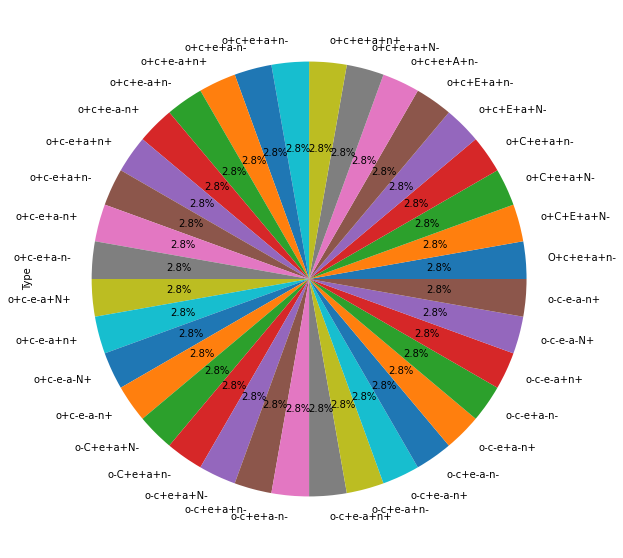

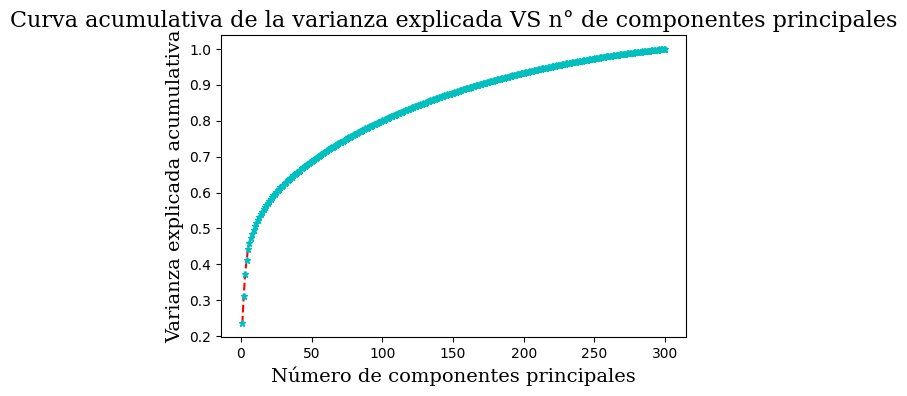

Se necesita por lo menos 10 componentes para una varianza explicada de 0.5.
Se necesita por lo menos 38 componentes para una varianza explicada de 0.65.
Se necesita por lo menos 100 componentes para una varianza explicada de 0.8.
Se necesita por lo menos 168 componentes para una varianza explicada de 0.9.


<Figure size 432x288 with 0 Axes>

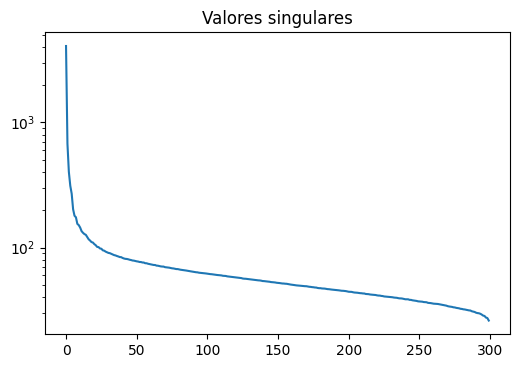

<Figure size 432x288 with 0 Axes>

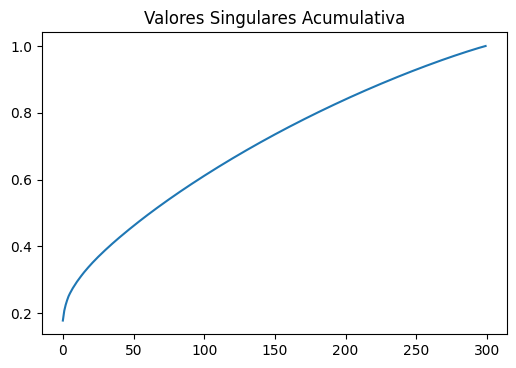

Mejor configuración de parámetros:
	pca__n_components: 110
	svc__kernel: rbf
Exactitud (val): 0.9379
Exactitud (test): 0.9509
Se ha generado un modelo junto con un subconjunto para tests del DataBase manipulado.


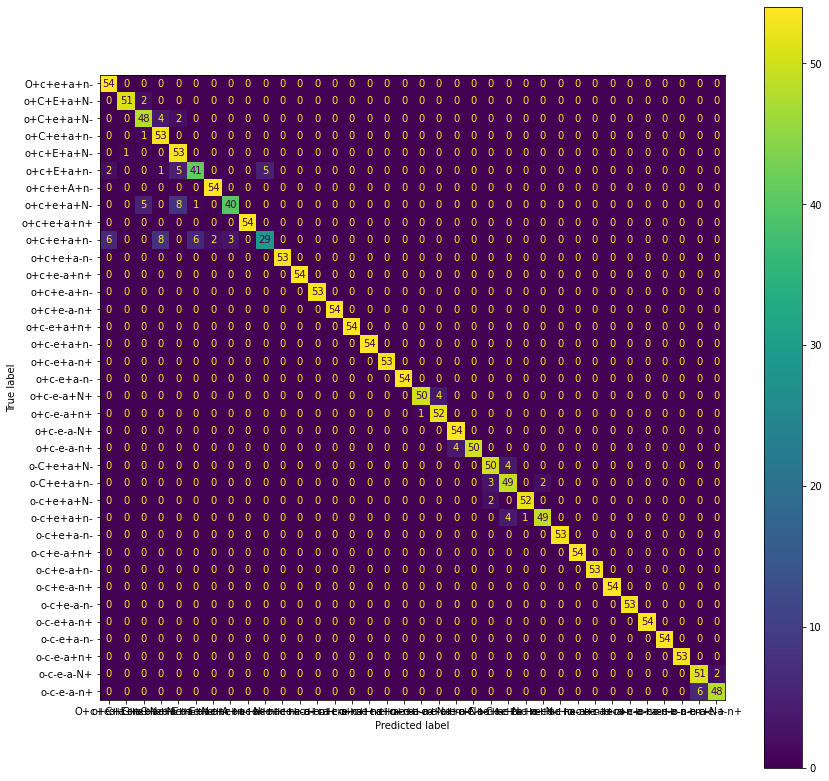

In [73]:
from sklearn.metrics import plot_confusion_matrix

# Ejecución de la función
gsearch_svmFuzzy_05, X_test_svmFuzzy_05, y_test_svmFuzzy_05=svm_function_fuzzy(BF_merged_ID_bin, 'type', 0.3, 22, clbelong_threshold=0.5,bajomuestreo=True)
    
fig, ax = plt.subplots(figsize=(14,14))
plot_confusion_matrix(gsearch_svmFuzzy_05, X_test_svmFuzzy_05, y_test_svmFuzzy_05, display_labels = gsearch_svmFuzzy_05.classes_, ax=ax)

### **4.1.2. Grado de pertenencia medio (0.65)**

Parámetros de entrada:
 Límite inferior de grado de pertenencia 0.65
 La clase de la fila necesita estar presente en un mínimo del 0.05% del DataBase introducido.


C:\Users\dynad\AppData\Local\Temp/ipykernel_4324/3858460293.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  BF_ds_filtered=BF_ds[BF_ds['class_belonging']>clbelong_threshold][BF_ds['presence']>rowFloor]


Dadas las condiciones, actualmente disponemos de 36 clases
Forma de los datasets:
X_train (3427, 300), y_train (3427,)
X_train (1469, 300), y_train (1469,))


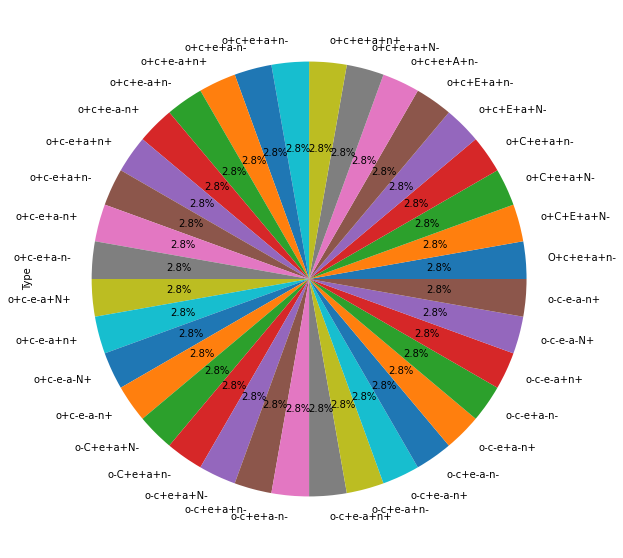

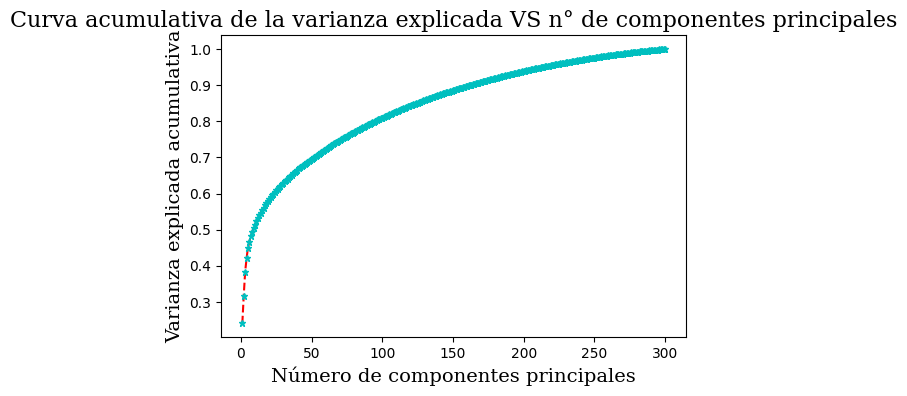

Se necesita por lo menos 9 componentes para una varianza explicada de 0.5.
Se necesita por lo menos 36 componentes para una varianza explicada de 0.65.
Se necesita por lo menos 95 componentes para una varianza explicada de 0.8.
Se necesita por lo menos 162 componentes para una varianza explicada de 0.9.


<Figure size 432x288 with 0 Axes>

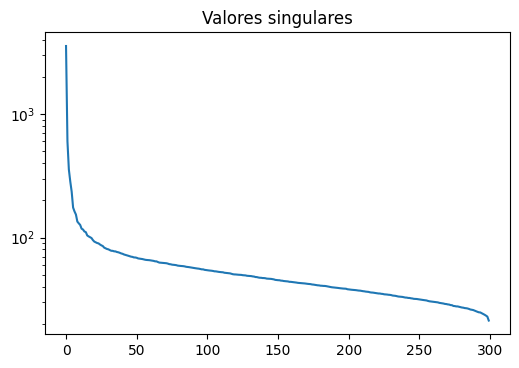

<Figure size 432x288 with 0 Axes>

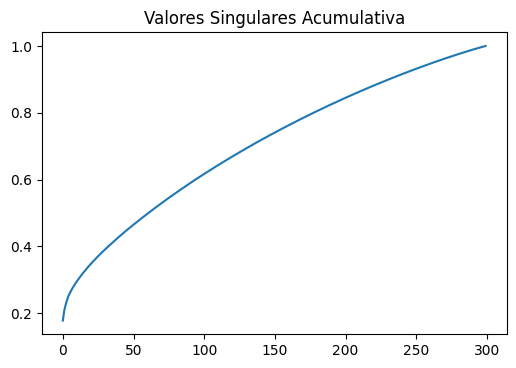

Mejor configuración de parámetros:
	pca__n_components: 110
	svc__kernel: rbf
Exactitud (val): 0.9300
Exactitud (test): 0.9530
Se ha generado un modelo junto con un subconjunto para tests del DataBase manipulado.


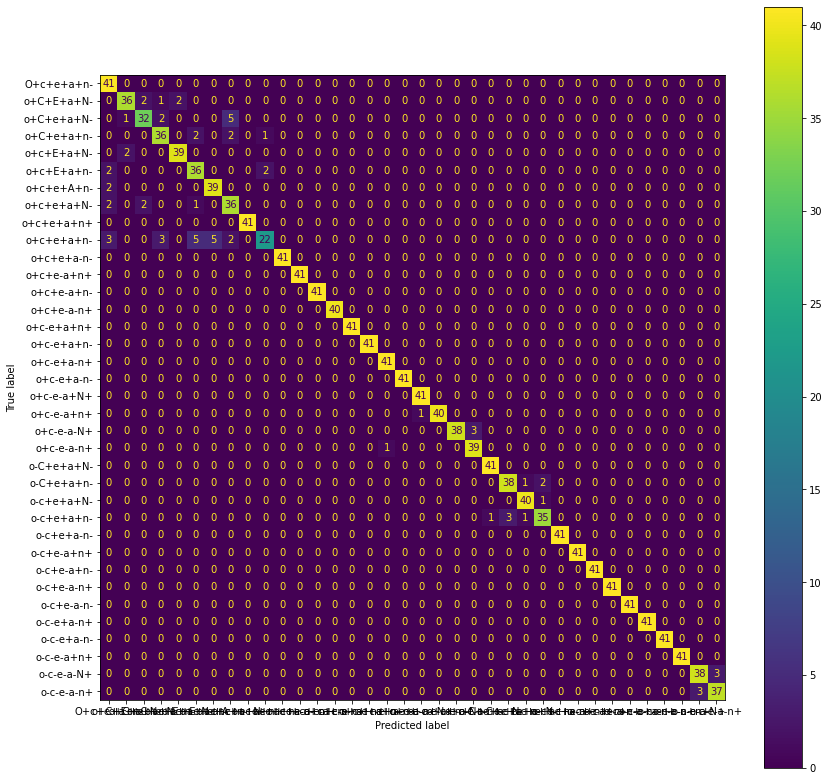

In [74]:
from sklearn.metrics import plot_confusion_matrix

# Ejecución de la función
gsearch_svmFuzzy_065, X_test_svmFuzzy_065, y_test_svmFuzzy_065=svm_function_fuzzy(BF_merged_ID_bin, 'type', 0.3, 765, clbelong_threshold=0.65, bajomuestreo=True)
    
fig, ax = plt.subplots(figsize=(14,14))
plot_confusion_matrix(gsearch_svmFuzzy_065, X_test_svmFuzzy_065, y_test_svmFuzzy_065, display_labels = gsearch_svmFuzzy_065.classes_, ax=ax) #.set_xticks(32)

### **4.1.3. Grado de pertenencia alto (0.75)**

Parámetros de entrada:
 Límite inferior de grado de pertenencia 0.75
 La clase de la fila necesita estar presente en un mínimo del 0.05% del DataBase introducido.


C:\Users\dynad\AppData\Local\Temp/ipykernel_4324/3858460293.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  BF_ds_filtered=BF_ds[BF_ds['class_belonging']>clbelong_threshold][BF_ds['presence']>rowFloor]


Dadas las condiciones, actualmente disponemos de 36 clases
Forma de los datasets:
X_train (1663, 300), y_train (1663,)
X_train (713, 300), y_train (713,))


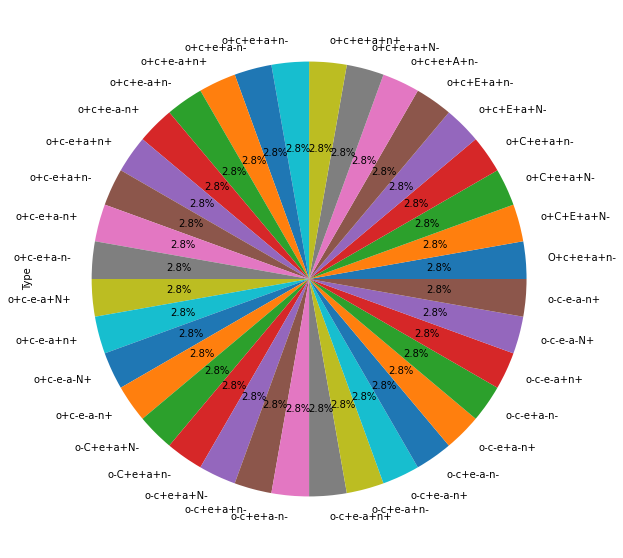

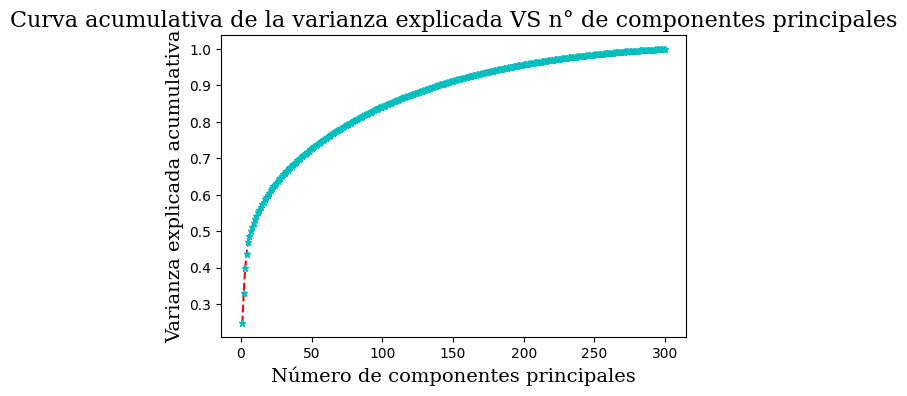

Se necesita por lo menos 7 componentes para una varianza explicada de 0.5.
Se necesita por lo menos 29 componentes para una varianza explicada de 0.65.
Se necesita por lo menos 79 componentes para una varianza explicada de 0.8.
Se necesita por lo menos 139 componentes para una varianza explicada de 0.9.


<Figure size 432x288 with 0 Axes>

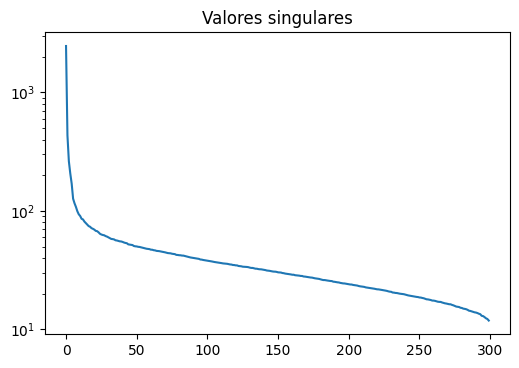

<Figure size 432x288 with 0 Axes>

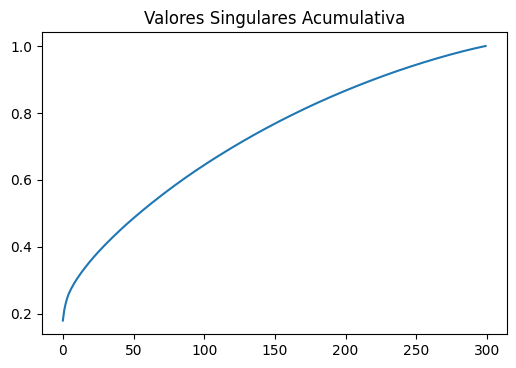

Mejor configuración de parámetros:
	pca__n_components: 11
	svc__kernel: rbf
Exactitud (val): 0.9609
Exactitud (test): 0.9649
Se ha generado un modelo junto con un subconjunto para tests del DataBase manipulado.


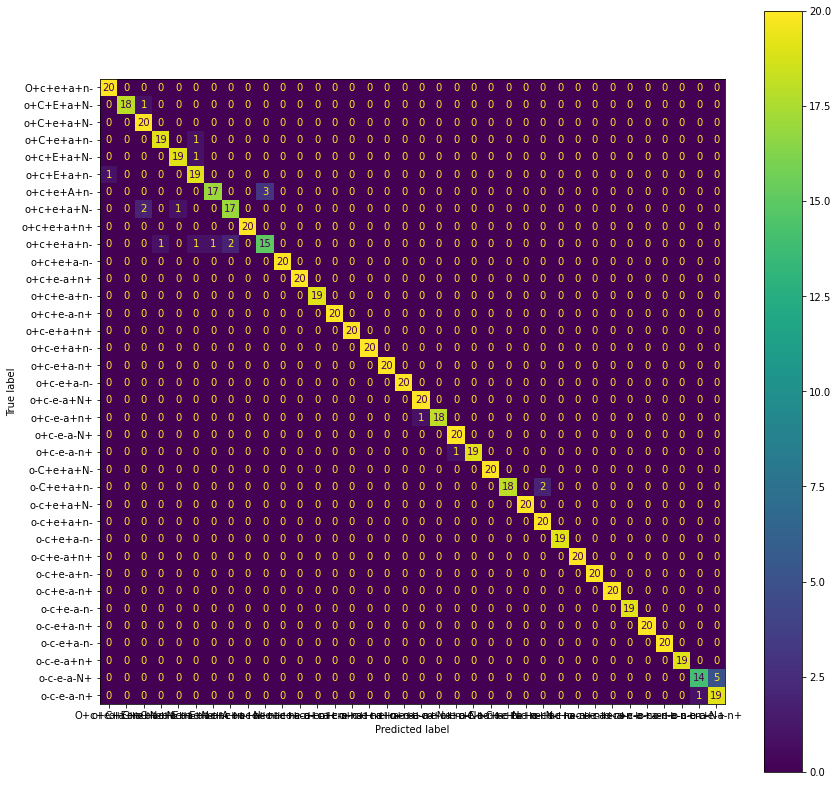

In [75]:
from sklearn.metrics import plot_confusion_matrix

# Ejecución de la función
gsearch_svmFuzzy_08, X_test_svmFuzzy_08, y_test_svmFuzzy_08=svm_function_fuzzy(BF_merged_ID_bin, 'type', 0.3, 22, clbelong_threshold=0.75, bajomuestreo=True)
    
fig, ax = plt.subplots(figsize=(14,14))
plot_confusion_matrix(gsearch_svmFuzzy_08, X_test_svmFuzzy_08, y_test_svmFuzzy_08, display_labels = gsearch_svmFuzzy_08.classes_, ax=ax)